In [1]:
#test2: with outliers (>Q3 + 1.5 IQR, < Q1 - 1.5IQR) removed before normalization
#test 2 + 
#1. Signed curvature computed (instead of absolute value) i.e. sign determined by direction
#2. Smoothing signed curvature
#3. Taking absolute value of signed curvature 
# For this modified curvature the next steps as always (sigmoid normalisation and comp BDD)
#for test 10: if sd < 1 then set sd = 1
import os
import sys 
sys.path.remove('/Users/karolinagrzeszkiewicz/robustness-tests2/locomotion/tests/robustness_tests')
sys.path.append('/Users/karolinagrzeszkiewicz/locomotion')
import locomotion 
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.cm as cm

In [2]:
FR_test_high = pd.read_csv("/Users/karolinagrzeszkiewicz/robustness-tests2/locomotion/tests/robustness_tests/results13/FR_test_higher/Results_BDD.csv")
FR_test_low = pd.read_csv("/Users/karolinagrzeszkiewicz/robustness-tests2/locomotion/tests/robustness_tests/results13/FR_test_lower/Results_BDD.csv")
density_test_high = pd.read_csv("/Users/karolinagrzeszkiewicz/robustness-tests2/locomotion/tests/robustness_tests/results13/density_test_higher/Results_BDD.csv") 
density_test_low = pd.read_csv("/Users/karolinagrzeszkiewicz/robustness-tests2/locomotion/tests/robustness_tests/results13/density_test_lower/Results_BDD.csv")

In [3]:
#some data cleaning
FR_high_sequence = []
for i in range(24, 254, 5):
    FR_high_sequence.append(i)
    
FR_test_high.columns = FR_high_sequence
FR_test_high['curve_no'] = list(range(0,50))
FR_test_high = FR_test_high.melt(id_vars=["curve_no"],var_name= "FR", value_name= "Value")
FR_test_high.sort_values(by=['curve_no','FR'],inplace=True)

FR_low_sequence = []
for i in range(6, 24, 1):
    FR_low_sequence.append(i)
    
FR_test_low.columns = FR_low_sequence
FR_test_low['curve_no'] = list(range(0,50))
FR_test_low = FR_test_low.melt(id_vars=["curve_no"],var_name= "FR", value_name= "Value")
FR_test_low.sort_values(by=['curve_no','FR'],inplace=True)

In [4]:
density_high_sequence = list(range(15, 90, 3))

#density values copied from the Results_variables.json file 
    
density_test_high.columns = density_high_sequence
density_test_high['curve_no'] = list(range(0,50))
density_test_high = density_test_high.melt(id_vars=["curve_no"],var_name= "density", value_name= "Value")
density_test_high.sort_values(by=['curve_no','density'],inplace=True)

density_low_sequence = list(range(1, 15, 1))
    
density_test_low.columns = density_low_sequence
density_test_low['curve_no'] = list(range(0,50))
density_test_low = density_test_low.melt(id_vars=["curve_no"],var_name= "density", value_name= "Value")
density_test_low.sort_values(by=['curve_no','density'],inplace=True)

In [5]:
density_test = pd.concat([density_test_low, density_test_high])
FR_test = pd.concat([FR_test_low, FR_test_high])

In [6]:
#assume we're given a data frame with 3 columns: 'curve_no', 'FR'/'RES', 'Value' (BDD) 
#important: if the data frame = 2 data frames merged then rememember not to double-count values for curves with meanVAR
#even if double counting it shouln't affect the outcome (only the number of curves will be greater)

def plotBDDforVar (data_Vartest, Var, meanVar):
    n_values = data_Vartest[Var].nunique()
    n_curves = int((len(data_Vartest.Value))/n_values) 
    colors = cm.rainbow(np.linspace(0, 1, 50))
    
    if Var == "FR":
        for i, c in zip(range(n_curves), colors):
            data = data_Vartest[data_Vartest.curve_no == i]
            data_curve = data[data.FR != meanVar]
            plt.scatter('FR','Value',data= data_curve[data_curve.curve_no == i], color = c)
        plt.title("BDD Value vs. Frame Rate (frames/sec) for " + str(n_curves) + " Randomly Generated Curves")
    elif Var == "density":
        for i, c in zip(range(n_curves), colors):
            data = data_Vartest[data_Vartest.curve_no == i]
            data_curve = data[data.density != meanVar]
            plt.scatter('density','Value',data= data_curve[data_curve.curve_no == i], color = c)
        plt.title("BDD Value vs. pixel density (px/mm) for " + str(n_curves) + " Randomly Generated Curves")
    else:
        print("The variable must be either FR (Frame Rate) or RES (Resolution)")
        
        
#add label, x and y, better title
#add more error messages if applied to wrong arguments
#investigate outliers
#plot curves separately/separate curves

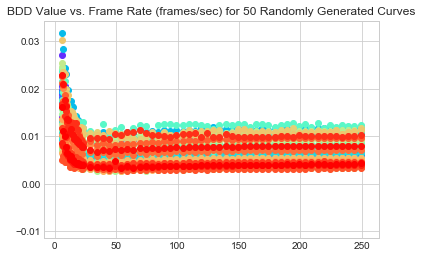

In [7]:
plotBDDforVar(FR_test, "FR", 24)

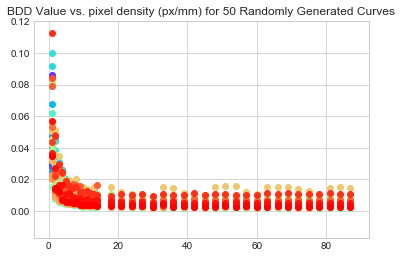

In [8]:
plotBDDforVar(density_test, "density", 15)

In [9]:
#plot curves separately 

def plotBDDforVarSep (var, meanVar, curves = range(50)):
    colors = cm.rainbow(np.linspace(0, 1, 50))
    if var == "FR":
        for i, c in zip(curves, colors):
            data = FR_test[FR_test.curve_no == i]
            data = data[data.FR != meanVar]
            label = 'curve ' + str(i)
            xlab = 'FR' + ' for '+ label
            ylab = 'BDD value' + ' for '+ label
            ax = sns.jointplot(x = 'FR', y = 'Value', data = data)
            ax.set_axis_labels(xlab, ylab, fontsize=14)
    elif var == "density":
        for i in curves:
            data = density_test[density_test.curve_no == i]
            data = data[data.density != meanVar]
            label = 'density_test_curve ' + str(i)
            xlab = 'density' + ' for '+ label
            ylab = 'BDD value' + ' for '+ label
            ax = sns.jointplot(x='density',y='Value', data= data)
            ax.set_axis_labels(xlab, ylab, fontsize=14)
    else:
        print("There is no such variable as " + var)

/opt/anaconda3/lib/python3.7/site-packages/seaborn/axisgrid.py:1676: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = plt.figure(figsize=(height, height))


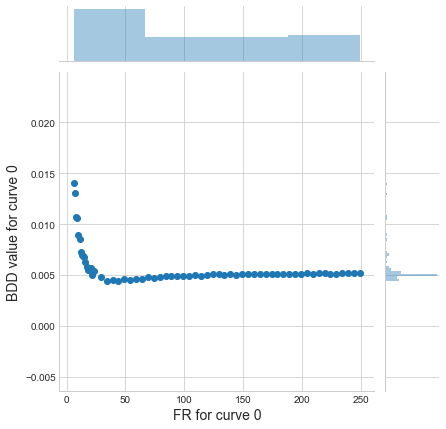

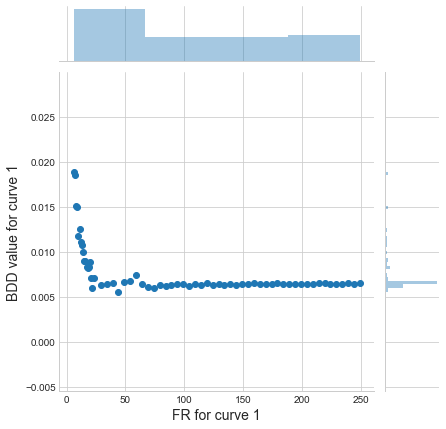

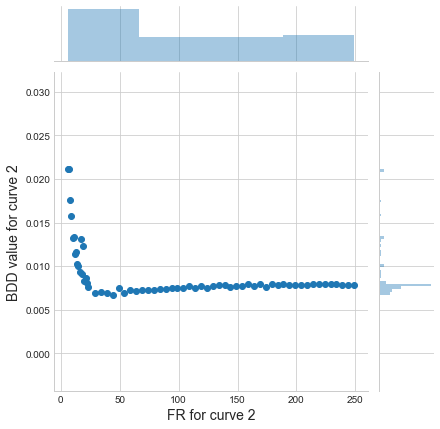

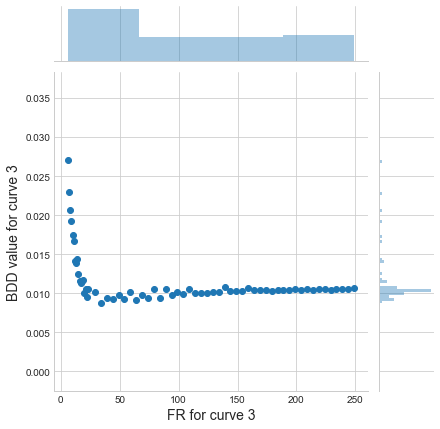

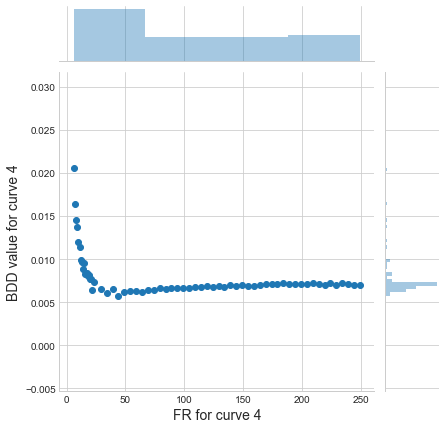

...

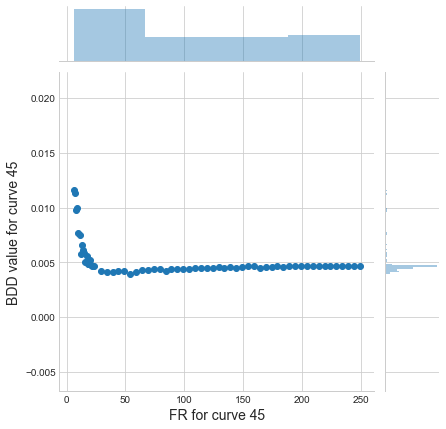

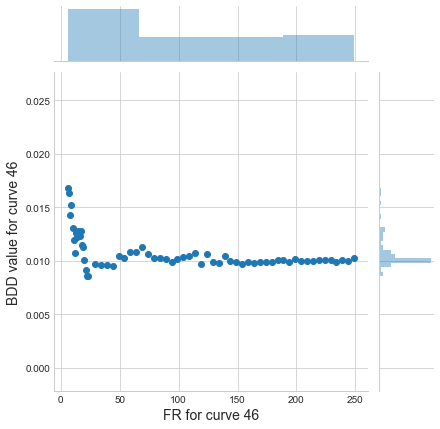

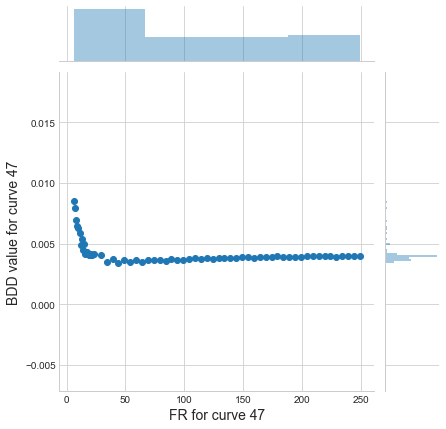

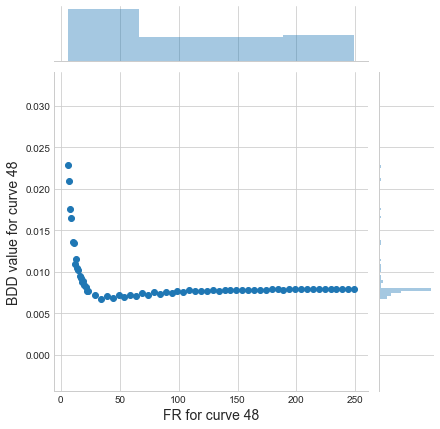

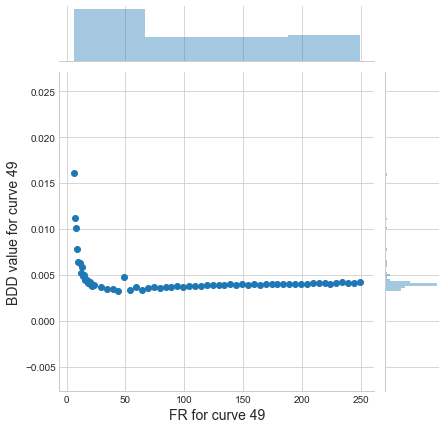

In [10]:
plotBDDforVarSep("FR", 24)
#outlier curves: 21, 34

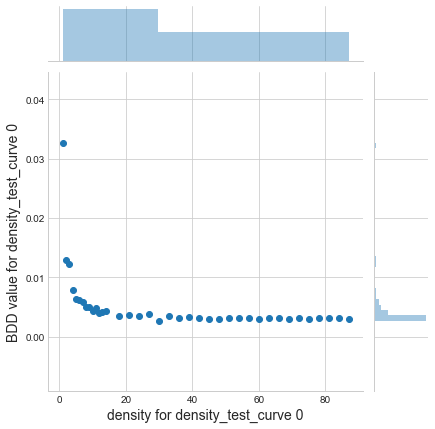

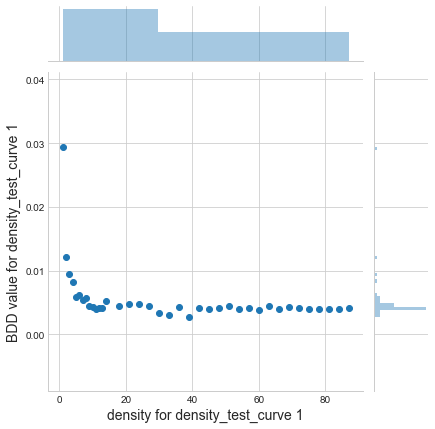

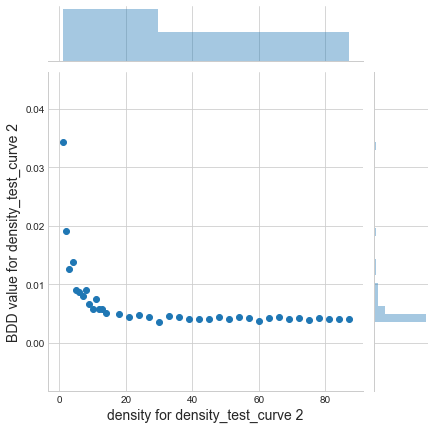

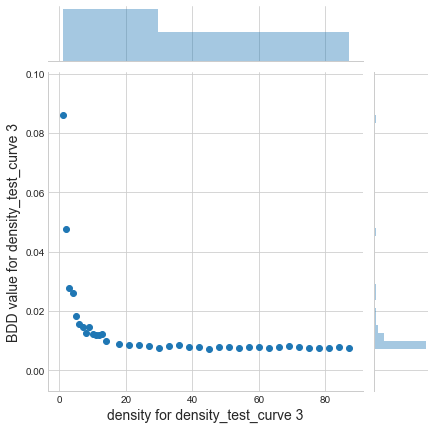

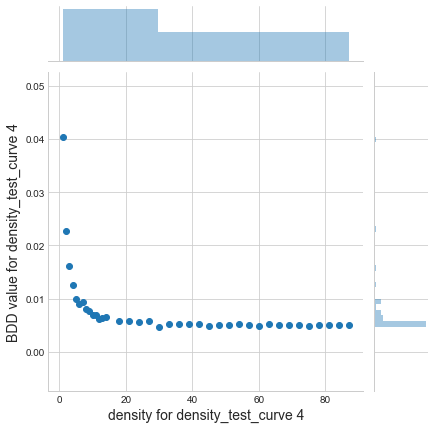

...

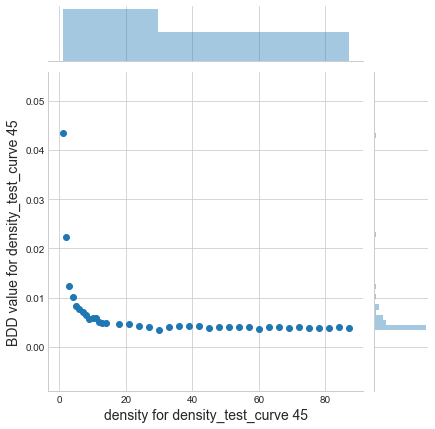

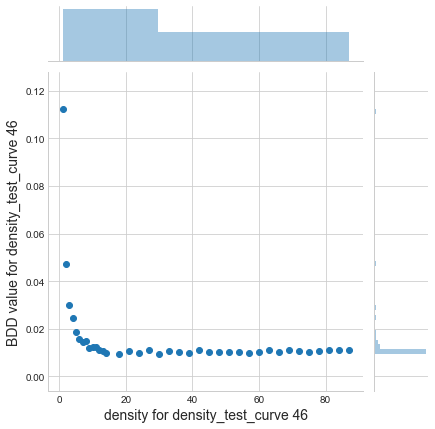

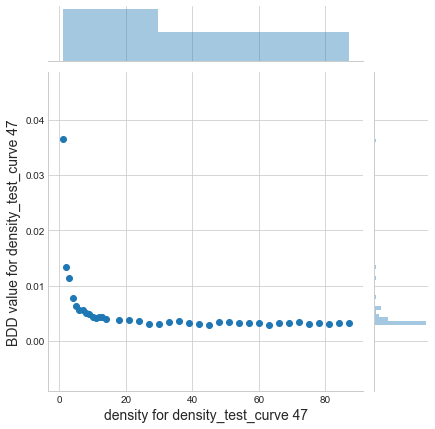

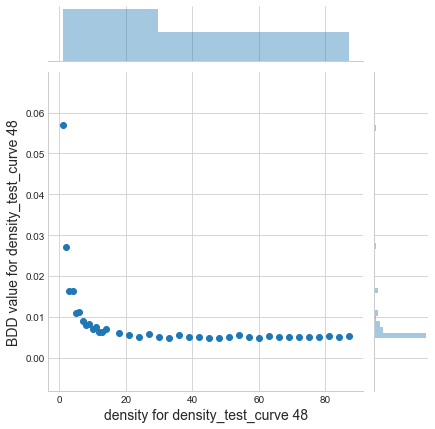

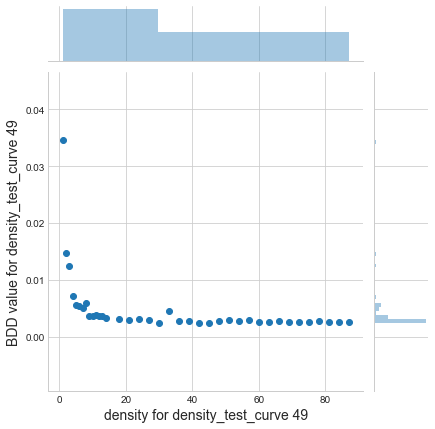

In [11]:
plotBDDforVarSep("density", 15)

## Regressions for FR test 

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
%matplotlib inline
from sklearn.metrics import mean_squared_error 
import os
import sys
import statsmodels.api as sm

In [18]:
#Fit sigmoid and its inverse to FR > 24 and <24 respectively
#for each curve get the coefficients and compute the horizontal asymptote by computing sigmoid for some very high FR

## Logistic regression for FR > 24: with curve_fit

In [219]:
r_values_FRhigh = np.zeros(50)
mse_values_FRhigh = np.zeros(50)
m_values_FRhigh = np.zeros(50)
c_values_FRhigh = np.zeros(50)
h_asymptote_FRhigh = np.zeros(50)
range_values_FRhigh = np.zeros(50)
min_BDD_values_FRhigh = np.zeros(50)
max_BDD_values_FRhigh = np.zeros(50)
# where y = mx + c / we want to store the gradient values to analyse them later

def fitLogisticRegression(curve):
    data = FR_test_high[FR_test_high.curve_no == curve]
    data = data[data.FR != 24]
    FR = np.array(data['FR']) #x-axis
    BDD = data['Value'] #y-axis
    
    def f(x):
    # return math.sqrt(x)
       return float(x)

    FR = np.array([f(xi) for xi in FR])
    BDD = np.array([f(xi) for xi in BDD])
    

    
    #transform data to fit within [0,1] range
    def sigmoid(x):
        return 1 / (1 + np.exp(-x))

    def inv_sigmoid(x):
        return (-np.log((1-x)/x))
    
    min_BDD = min(BDD)
    max_BDD = max(BDD)
    
    max_BDD_values_FRhigh[curve] = max_BDD
    
    min_BDD_values_FRhigh[curve] = min_BDD
    
    BDD = BDD - min_BDD
    
    range_ = max_BDD - min_BDD
    
    BDD = BDD/range_
    
    BDD_transformed = BDD.tolist()
           
    BDD_within_range = BDD[BDD < 1]
    BDD_within_range = BDD_within_range[BDD_within_range>0]
    inv_sigmoid_BDD = inv_sigmoid(BDD_within_range) #
    
    o1 = BDD_transformed.index(1)
    o2 = BDD_transformed.index(0)
    FR_n = np.delete(FR, o1)
    FR_new = np.delete(FR_n, o2)
    
    curve_fit = np.polyfit(FR_new, inv_sigmoid_BDD, 1)
    
   

 #1. Linear transformation curve
    plt.plot(FR, curve_fit[0]*FR + curve_fit[1], label = 'predicted values')
    plt.plot(FR_new, inv_sigmoid_BDD, "o", label = 'actual values')
    plt.title("FR vs inverse sigmoid of transformed BDD for curve no." + str(curve))
    plt.xlabel('FR')
    plt.ylabel('-ln((1-x)/x)')
    plt.legend()
    plt.show()

#equation fo the line: inv_sigmoid(BDD_transformed) = curve_fit[0] * FR + curve_fit[1]

    inv_sigmoid_BDD_pred = curve_fit[0] * FR_new + curve_fit[1]
    
    def bdd_model(fr, min_BDD, max_BDD):
        s = sigmoid(curve_fit[0] * fr + curve_fit[1])
        return (max_BDD - min_BDD)*s + min_BDD
    
    h_asymptote_FRhigh[curve] = bdd_model(10000, min_BDD, max_BDD)
    
    print('Equation of the line of best fit for curve no. '+str(curve)+': '+'inv_sigmoid_BDD_pred = '+str(range_) +'*'+str(curve_fit[0])+ '*FR '+'+ '+str(curve_fit[1]) + '+'+str(min_BDD))

#correlation coef (Pearson's r):
    r_matrix = np.corrcoef(FR_new, inv_sigmoid_BDD)
    r = r_matrix[0, 1]
    print('The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =' + str(r))
    r_values_FRhigh[curve] = r

#mean-squared-error
    mse = mean_squared_error(inv_sigmoid_BDD, inv_sigmoid_BDD_pred) 
    print('The Mean-Squared Error is equal to ' + str(mse))
    mse_values_FRhigh[curve]=mse
    
#store gradient value and c-value
    m_values_FRhigh[curve]= curve_fit[0]
    c_values_FRhigh[curve]= curve_fit[1]
    range_values_FRhigh[curve] = range_


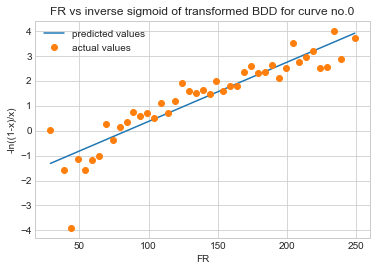

Equation of the line of best fit for curve no. 0: inv_sigmoid_BDD_pred = 0.0007904785888399471*0.023700204552974672*FR + -2.0028598450551613+0.0044113400442701714
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9123221755525465
The Mean-Squared Error is equal to 0.4412890585238179


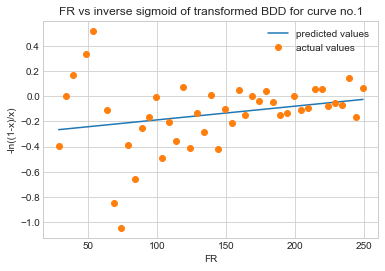

Equation of the line of best fit for curve no. 1: inv_sigmoid_BDD_pred = 0.0018738480174048493*0.0010913952074276345*FR + -0.2971530843071154+0.005558548992978844
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.2502344038924108
The Mean-Squared Error is equal to 0.07199465633839956


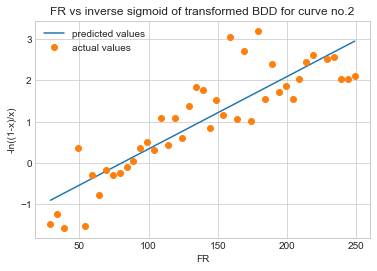

Equation of the line of best fit for curve no. 2: inv_sigmoid_BDD_pred = 0.00129683214988401*0.017576507560780216*FR + -1.420053153131667+0.006712936041388164
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8778742840443214
The Mean-Squared Error is equal to 0.37093631724097265


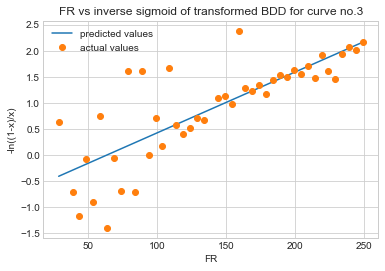

Equation of the line of best fit for curve no. 3: inv_sigmoid_BDD_pred = 0.002140132003500982*0.011683692294538106*FR + -0.7445600620519268+0.008708035003424434
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7914478458596252
The Mean-Squared Error is equal to 0.3379308498036808


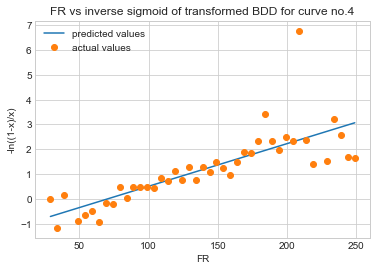

Equation of the line of best fit for curve no. 4: inv_sigmoid_BDD_pred = 0.0015334624407816666*0.017165994932564484*FR + -1.2071227642924218+0.005743612065471735
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7831242786112346
The Mean-Squared Error is equal to 0.7497117814604219


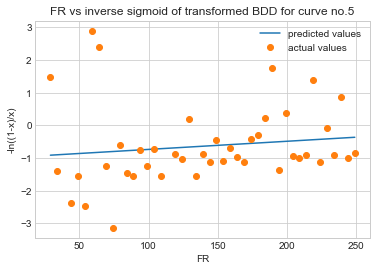

Equation of the line of best fit for curve no. 5: inv_sigmoid_BDD_pred = 0.0034430193163693104*0.002491224334751283*FR + -0.9855955418252982+0.006250069917860525
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.1342809496870757
The Mean-Squared Error is equal to 1.4050776468672381


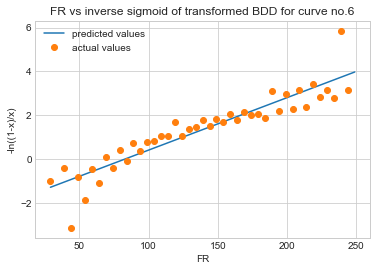

Equation of the line of best fit for curve no. 6: inv_sigmoid_BDD_pred = 0.0009408441691183206*0.02390999353753103*FR + -1.981859247792655+0.005155974398569155
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9181508732166614
The Mean-Squared Error is equal to 0.4125701662163906


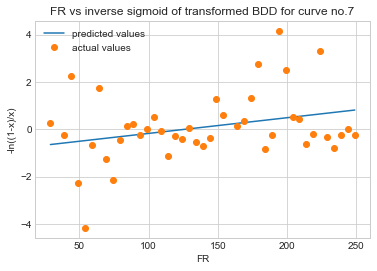

Equation of the line of best fit for curve no. 7: inv_sigmoid_BDD_pred = 0.002457581659181581*0.0066255939198279715*FR + -0.8391390948148795+0.004436938631121193
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.2972003703703551
The Mean-Squared Error is equal to 1.8772577385034528


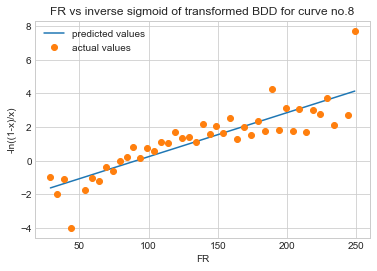

Equation of the line of best fit for curve no. 8: inv_sigmoid_BDD_pred = 0.0008701264091971203*0.02611625753048701*FR + -2.3707725506054653+0.004939202365086997
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8609827008898703
The Mean-Squared Error is equal to 0.9501970651222383


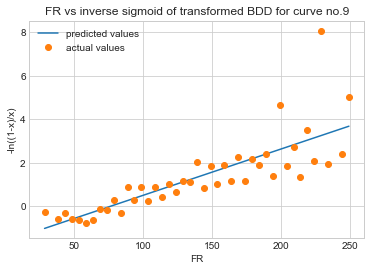

Equation of the line of best fit for curve no. 9: inv_sigmoid_BDD_pred = 0.0010613849351832705*0.02136861294694462*FR + -1.6310058508017755+0.0032318583292597807
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7985239543408975
The Mean-Squared Error is equal to 1.0181831311694014


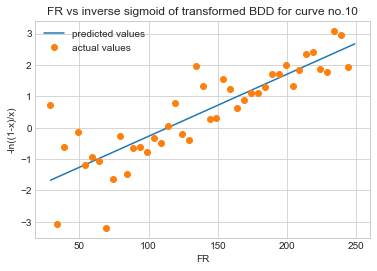

Equation of the line of best fit for curve no. 10: inv_sigmoid_BDD_pred = 0.000881220550556637*0.01975555504805714*FR + -2.248929113875014+0.004099406865019631
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8510138498941776
The Mean-Squared Error is equal to 0.5827748650042985


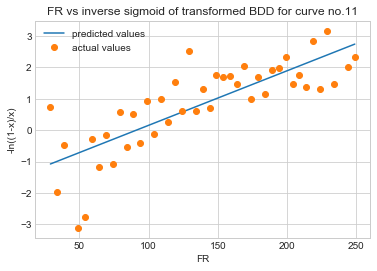

Equation of the line of best fit for curve no. 11: inv_sigmoid_BDD_pred = 0.0005269746804353235*0.017339571557983997*FR + -1.578897297695718+0.0038610900960344345
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7939893102379978
The Mean-Squared Error is equal to 0.6998165481996538


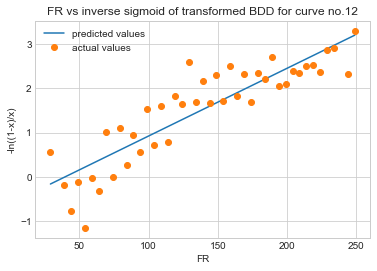

Equation of the line of best fit for curve no. 12: inv_sigmoid_BDD_pred = 0.0014807658670542819*0.015300283816380343*FR + -0.6076298043113231+0.005563375245201521
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8855308057096333
The Mean-Squared Error is equal to 0.2528269519906411


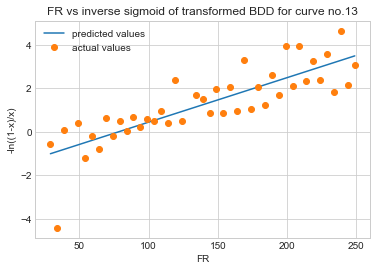

Equation of the line of best fit for curve no. 13: inv_sigmoid_BDD_pred = 0.0018653053313025525*0.020427172952221673*FR + -1.5937003303245845+0.0099992020649458
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8220239133186115
The Mean-Squared Error is equal to 0.8399546612103431


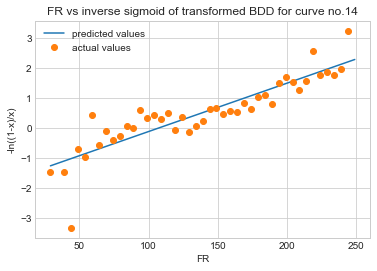

Equation of the line of best fit for curve no. 14: inv_sigmoid_BDD_pred = 0.0016605437925204377*0.01611547095778536*FR + -1.738815401059884+0.005690920152387417
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8811291817011175
The Mean-Squared Error is equal to 0.28984839429416354


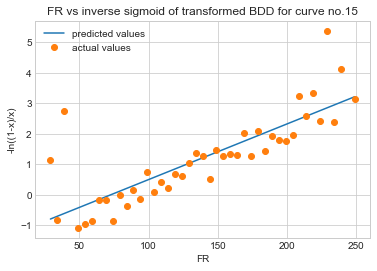

Equation of the line of best fit for curve no. 15: inv_sigmoid_BDD_pred = 0.0005315588654739656*0.0182368561300144*FR + -1.3235723058840678+0.003277371372513489
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8087574785653321
The Mean-Squared Error is equal to 0.6941216023093332


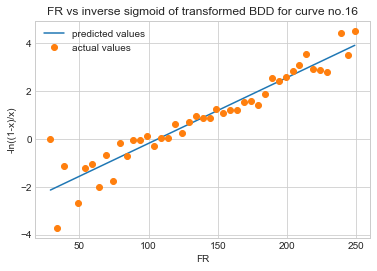

Equation of the line of best fit for curve no. 16: inv_sigmoid_BDD_pred = 0.0011829025246166414*0.027521187682413153*FR + -2.935245396214558+0.005204632276084998
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9472349175861512
The Mean-Squared Error is equal to 0.3463265250288694


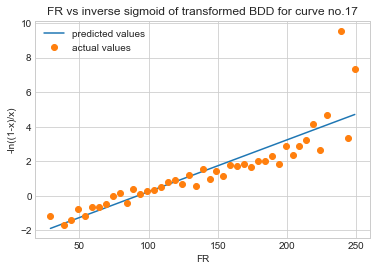

Equation of the line of best fit for curve no. 17: inv_sigmoid_BDD_pred = 0.002191256304127227*0.03000466247673764*FR + -2.766293421209072+0.00604185142382506
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8760575199120765
The Mean-Squared Error is equal to 1.0764305493917063


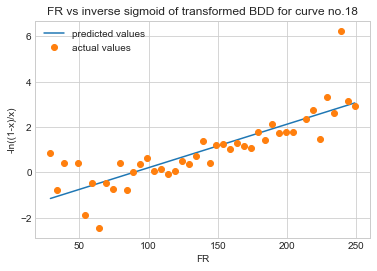

Equation of the line of best fit for curve no. 18: inv_sigmoid_BDD_pred = 0.00035787875978063885*0.019157862159549035*FR + -1.709951450608995+0.0031476796008371136
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8264524899993043
The Mean-Squared Error is equal to 0.696404129041817


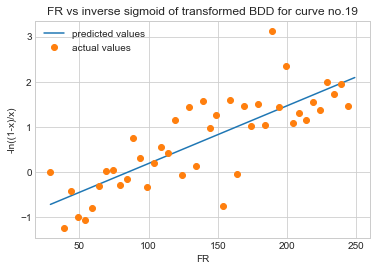

Equation of the line of best fit for curve no. 19: inv_sigmoid_BDD_pred = 0.0018990990517175933*0.012797998151644877*FR + -1.0961721674129206+0.009088830172338759
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7982504692024573
The Mean-Squared Error is equal to 0.3613587942083618


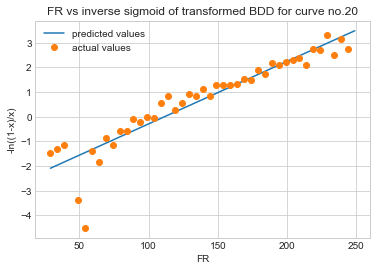

Equation of the line of best fit for curve no. 20: inv_sigmoid_BDD_pred = 0.0011786316302025163*0.025369039364058148*FR + -2.825691759715722+0.004115267416833904
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9261342421677923
The Mean-Squared Error is equal to 0.41862956989449157


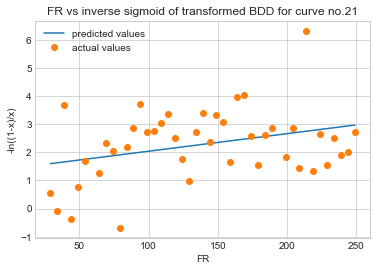

Equation of the line of best fit for curve no. 21: inv_sigmoid_BDD_pred = 0.004496483763292957*0.006226963240010858*FR + 1.416384543713513+0.008224543945274665
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.3235798461186949
The Mean-Squared Error is equal to 1.3903010097297361


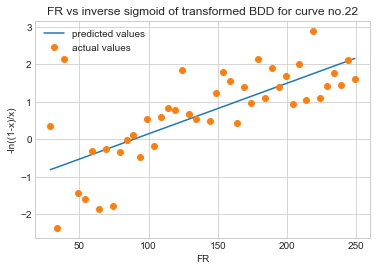

Equation of the line of best fit for curve no. 22: inv_sigmoid_BDD_pred = 0.0015415765484117*0.013494578409930883*FR + -1.2040325963924683+0.0059242944029272455
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7303923827467229
The Mean-Squared Error is equal to 0.668540996501928


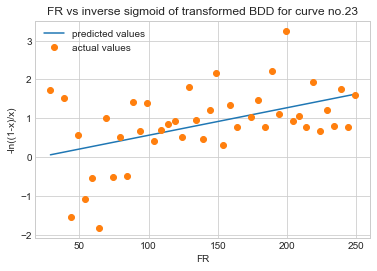

Equation of the line of best fit for curve no. 23: inv_sigmoid_BDD_pred = 0.00197211871277118*0.007085347342619579*FR + -0.14442186257080417+0.0068643283994577935
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.47718492928314915
The Mean-Squared Error is equal to 0.7036174177709215


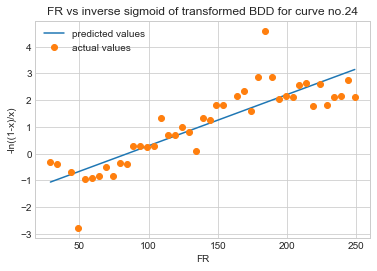

Equation of the line of best fit for curve no. 24: inv_sigmoid_BDD_pred = 0.001134719910463977*0.019144712799131613*FR + -1.6173209274153533+0.004326229554877034
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8610890190227237
The Mean-Squared Error is equal to 0.5325712304044675


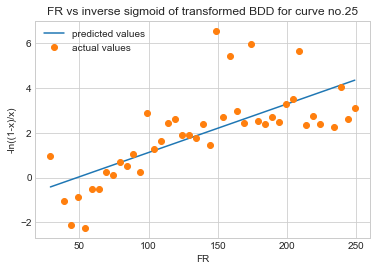

Equation of the line of best fit for curve no. 25: inv_sigmoid_BDD_pred = 0.0004574230530087508*0.02164535691271157*FR + -1.0438329331459995+0.0031793186006446802
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7116067993349758
The Mean-Squared Error is equal to 1.8121712440437332


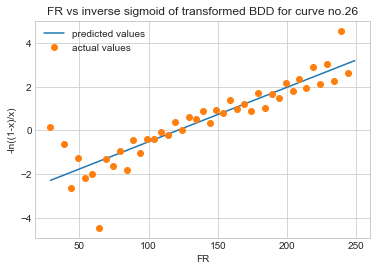

Equation of the line of best fit for curve no. 26: inv_sigmoid_BDD_pred = 0.000687841260889552*0.024962975179124946*FR + -3.0124153161084353+0.0029906903485719736
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8963657950336609
The Mean-Squared Error is equal to 0.5906328027671528


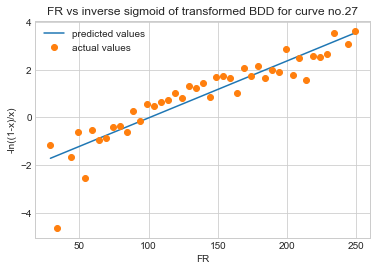

Equation of the line of best fit for curve no. 27: inv_sigmoid_BDD_pred = 0.0007144343587215281*0.023822793432607757*FR + -2.398927766840578+0.004349372545686524
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.914069515697199
The Mean-Squared Error is equal to 0.4410351590513745


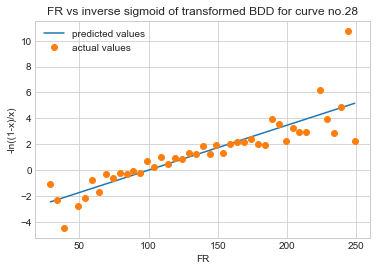

Equation of the line of best fit for curve no. 28: inv_sigmoid_BDD_pred = 0.0007525114928829992*0.034574886395391684*FR + -3.439470957262834+0.0041834241269329935
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8702454133101931
The Mean-Squared Error is equal to 1.552878713839625


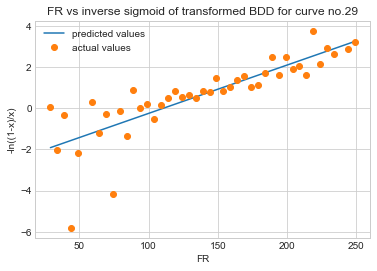

Equation of the line of best fit for curve no. 29: inv_sigmoid_BDD_pred = 0.0007590031646141507*0.023497501088995516*FR + -2.591504439851694+0.002691927328431707
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8180466890273889
The Mean-Squared Error is equal to 1.0950213269572049


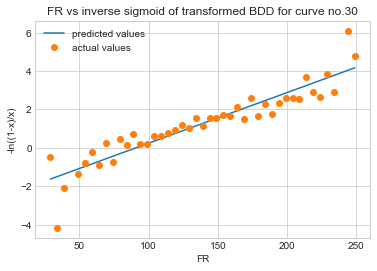

Equation of the line of best fit for curve no. 30: inv_sigmoid_BDD_pred = 0.002289066437430074*0.026362001863709485*FR + -2.3927060144244443+0.009028304671122112
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9213683874272498
The Mean-Squared Error is equal to 0.49104938123849773


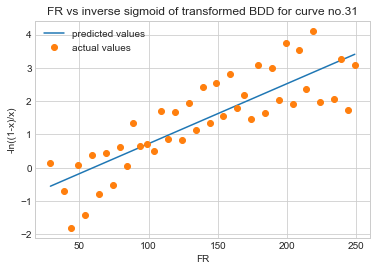

Equation of the line of best fit for curve no. 31: inv_sigmoid_BDD_pred = 0.001695981927733855*0.018013284218699438*FR + -1.0774107947461808+0.007629151343624419
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.83901707931354
The Mean-Squared Error is equal to 0.5414653313087321


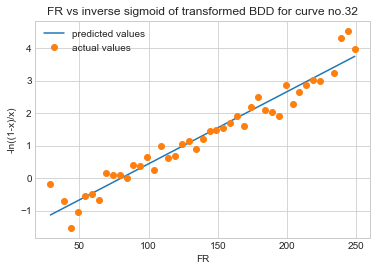

Equation of the line of best fit for curve no. 32: inv_sigmoid_BDD_pred = 0.0008189767118001534*0.02216816744806683*FR + -1.7767384556891126+0.003913957946252557
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9707886752884096
The Mean-Squared Error is equal to 0.11911388344413353


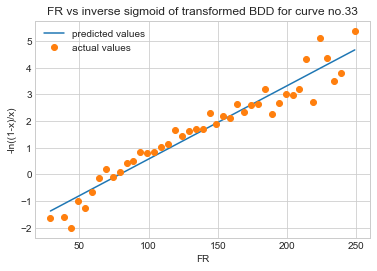

Equation of the line of best fit for curve no. 33: inv_sigmoid_BDD_pred = 0.0014852459456369295*0.027470609241754085*FR + -2.170926218580961+0.0034770156672002048
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9654191569262373
The Mean-Squared Error is equal to 0.21461502676924704


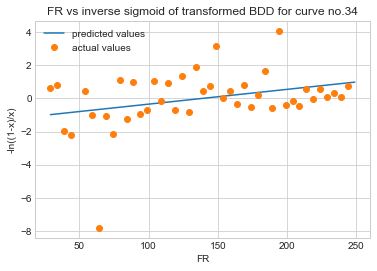

Equation of the line of best fit for curve no. 34: inv_sigmoid_BDD_pred = 0.003095828422830727*0.008927608913031133*FR + -1.2398325545737938+0.008630120719346355
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.3277320987338277
The Mean-Squared Error is equal to 2.6115040072822304


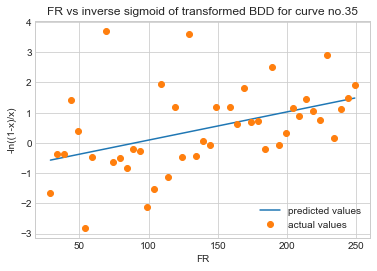

Equation of the line of best fit for curve no. 35: inv_sigmoid_BDD_pred = 0.0019465427279950938*0.009326583314802038*FR + -0.840599813571661+0.009503298071429526
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.4435185752560234
The Mean-Squared Error is equal to 1.5184835285266525


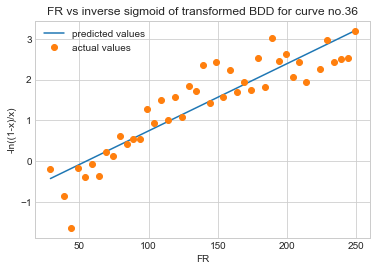

Equation of the line of best fit for curve no. 36: inv_sigmoid_BDD_pred = 0.0010794875789016485*0.016465841139768463*FR + -0.9044443348268234+0.004438258402777491
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9106028802816897
The Mean-Squared Error is equal to 0.22379323623720707


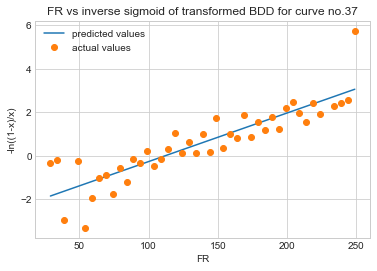

Equation of the line of best fit for curve no. 37: inv_sigmoid_BDD_pred = 0.0007264913118406515*0.02233295322678914*FR + -2.5017712298927757+0.002725430677345271
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8720732948504532
The Mean-Squared Error is equal to 0.6305277045327327


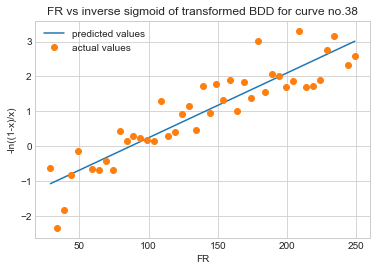

Equation of the line of best fit for curve no. 38: inv_sigmoid_BDD_pred = 0.0009635899922039266*0.0186027744123335*FR + -1.621597138579977+0.0039021288916828174
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9114036095971411
The Mean-Squared Error is equal to 0.2830562763495383


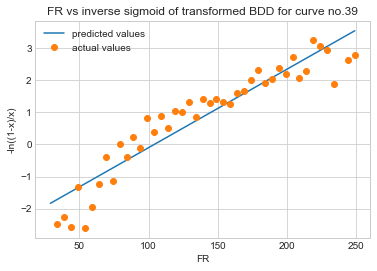

Equation of the line of best fit for curve no. 39: inv_sigmoid_BDD_pred = 0.0009067287779773556*0.024460155962445548*FR + -2.5440954643578033+0.0032639200743744905
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9380794709126369
The Mean-Squared Error is equal to 0.31810793142879124


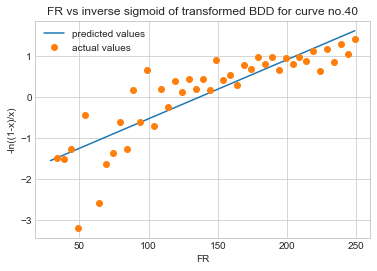

Equation of the line of best fit for curve no. 40: inv_sigmoid_BDD_pred = 0.0011384101626540181*0.014439660460536609*FR + -1.9697026337123473+0.007048443760649427
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8514019492189654
The Mean-Squared Error is equal to 0.31360741136413706


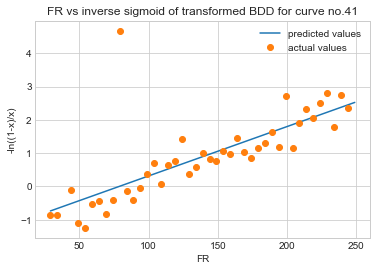

Equation of the line of best fit for curve no. 41: inv_sigmoid_BDD_pred = 0.0010150343901072557*0.014809849828131149*FR + -1.1647711204678362+0.0031620997540811988
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7484733082438633
The Mean-Squared Error is equal to 0.67130647836293


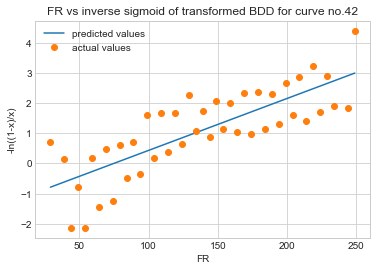

Equation of the line of best fit for curve no. 42: inv_sigmoid_BDD_pred = 0.0012788884345294946*0.017210273008472023*FR + -1.2858867782804824+0.0059049390690868115
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7869902742485819
The Mean-Squared Error is equal to 0.7142790222594368


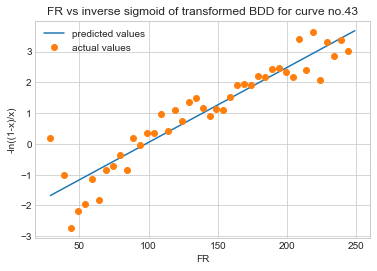

Equation of the line of best fit for curve no. 43: inv_sigmoid_BDD_pred = 0.0016556257664397753*0.024330622385763848*FR + -2.3833956229634086+0.008057434974949573
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9357187681426462
The Mean-Squared Error is equal to 0.3259960960917447


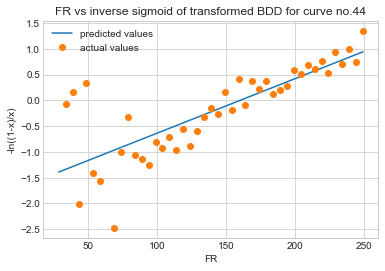

Equation of the line of best fit for curve no. 44: inv_sigmoid_BDD_pred = 0.0006463343574794351*0.010611910407825399*FR + -1.6996153932929159+0.002787878222275606
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.7895892975704898
The Mean-Squared Error is equal to 0.2708412971390071


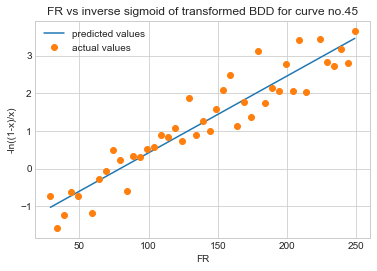

Equation of the line of best fit for curve no. 45: inv_sigmoid_BDD_pred = 0.0007640552508089106*0.020394332947210107*FR + -1.6205726457469014+0.003932870488249693
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9447738851572771
The Mean-Squared Error is equal to 0.20498778009195234


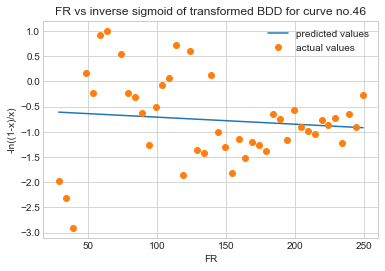

Equation of the line of best fit for curve no. 46: inv_sigmoid_BDD_pred = 0.0018374599242463232*-0.0014029124756559112*FR + -0.5709718726127747+0.009494476343455129
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =-0.10718984725527972
The Mean-Squared Error is equal to 0.6898910876458666


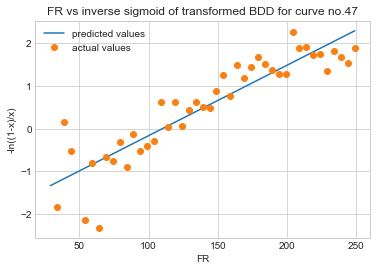

Equation of the line of best fit for curve no. 47: inv_sigmoid_BDD_pred = 0.0006246513647077557*0.01646710713924723*FR + -1.8084021100438756+0.0034211827585959326
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8988275999854037
The Mean-Squared Error is equal to 0.25285377478537696


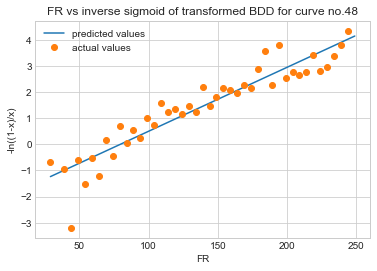

Equation of the line of best fit for curve no. 48: inv_sigmoid_BDD_pred = 0.0012174063775797876*0.02442466278638541*FR + -1.943520461800381+0.006782550349384258
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.9328303002069216
The Mean-Squared Error is equal to 0.34489681838325825


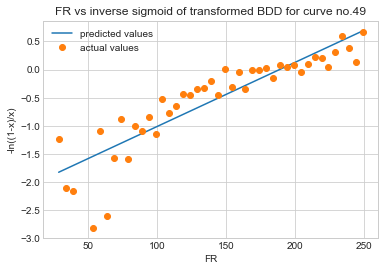

Equation of the line of best fit for curve no. 49: inv_sigmoid_BDD_pred = 0.001465730982429637*0.011438029652295378*FR + -2.1584468250126423+0.003298907526120021
The correlation coeffcient for FR and inverse sigmoid of BDD is equal to r =0.8875019828908756
The Mean-Squared Error is equal to 0.1409367458454927
[ 0.91232218  0.2502344   0.87787428  0.79144785  0.78312428  0.13428095
  0.91815087  0.29720037  0.8609827   0.79852395  0.85101385  0.79398931
  0.88553081  0.82202391  0.88112918  0.80875748  0.94723492  0.87605752
  0.82645249  0.79825047  0.92613424  0.32357985  0.73039238  0.47718493
  0.86108902  0.7116068   0.8963658   0.91406952  0.87024541  0.81804669
  0.92136839  0.83901708  0.97078868  0.96541916  0.3277321   0.44351858
  0.91060288  0.87207329  0.91140361  0.93807947  0.85140195  0.74847331
  0.78699027  0.93571877  0.7895893   0.94477389 -0.10718985  0.8988276
  0.9328303   0.88750198]
[ 0.0237002   0.0010914   0.01757651  0.01168369  0.01716599  0.00249122
  0.023

In [91]:
for c in range(50):
    fitLogisticRegression(c)
print(r_values_FRhigh)
print(m_values_FRhigh)
print(c_values_FRhigh)
print(mse_values_FRhigh)
print(range_values_FRhigh)
print(min_BDD_values_FRhigh)

In [107]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def inv_sigmoid(x):
    return (-np.log((1-x)/x))

def sigmoid_v2(x):
    return ((-1) / (1 + np.exp(-x)))

def inv_sigmoid_v2(x):
    return (-np.log((x+1)/(-x)))

## Regression for FR > 24: with statsmodel.api


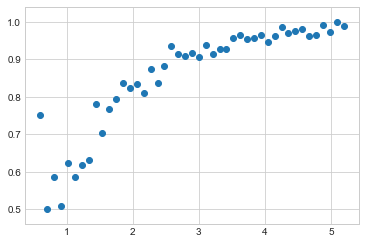

In [276]:
data = FR_test_high[FR_test_high.curve_no == 0]
data = data[data.FR != 24]
FR = np.array(data['FR']) #x-axis
BDD = data['Value'] #y-axis

def f(x):
# return math.sqrt(x)
   return float(x)

FR = np.array([f(xi) for xi in FR])
BDD = np.array([f(xi) for xi in BDD])

#some scaling
min_BDD = min(BDD)
range_ = max(BDD) - min(BDD)
#min_BDD_values_FRhigh1[curve] = min(BDD)
fr_t = FR/48
bdd_t = (BDD-min_BDD)*(1/(2*range_)) + 0.4999999

plt.scatter(fr_t, bdd_t)


In [302]:
import statsmodels.api as sm

r_values_FRhigh1 = np.zeros(50)
mse_values_FRhigh1 = np.zeros(50)
m_values_FRhigh1 = np.zeros(50)
c_values_FRhigh1 = np.zeros(50)
min_BDD_values_FRhigh1 = np.zeros(50)
range_BDD_values_FRhigh1 = np.zeros(50)
h_asymptote1 = np.zeros(50)

def fitSigmRegressionSm(curve):
    data = FR_test_high[FR_test_high.curve_no == 0]
    data = data[data.FR != 24]
    FR = np.array(data['FR']) #x-axis
    BDD = data['Value'] #y-axis

    def f(x):
    # return math.sqrt(x)
       return float(x)

    FR = np.array([f(xi) for xi in FR])
    BDD = np.array([f(xi) for xi in BDD])

    #some scaling
    min_BDD = min(BDD)
    range_ = max(BDD) - min(BDD)
    range_BDD_values_FRhigh1[curve] = range_
    min_BDD_values_FRhigh1[curve] = min(BDD)
    fr_t = FR/48
    bdd_t = (BDD-min_BDD)*(1/(2*range_)) + 0.49999
    

    plt.scatter(fr_t, bdd_t)
    
    min_BDD_values_FRlow[curve] = min_BDD
    
    fr_t_w_ones = sm.add_constant(fr_t)
    
    model = sm.Logit(bdd_t, fr_t_w_ones)
    result = model.fit(method='newton')
    const, m = result.params
    result.summary()

    plt.plot(fr_t, sigmoid(m*fr_t + const), "b", label = 'predicted values')
    plt.title("FR vs BDD for curve no." + str(curve))
    plt.xlabel('FR transformed')
    plt.ylabel('BDD transformed')
    plt.legend()
    plt.show()

    
    m_values_FRhigh1[curve]= m
    c_values_FRhigh1[curve]= const

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


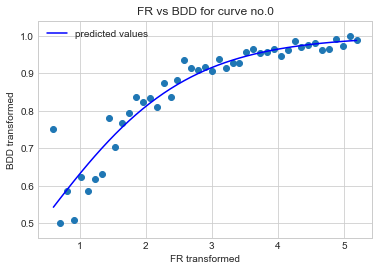

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


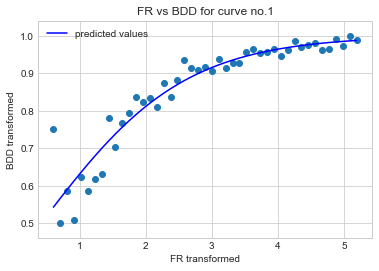

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


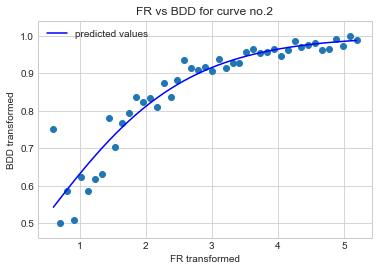

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


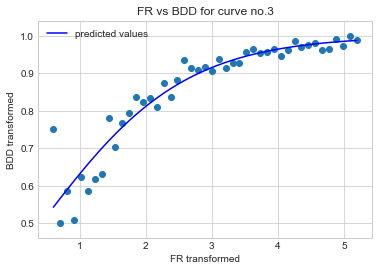

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


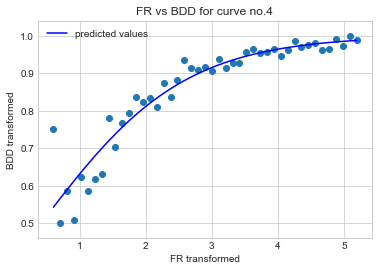

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


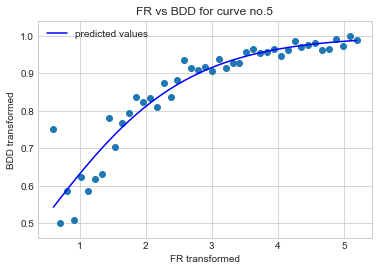

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


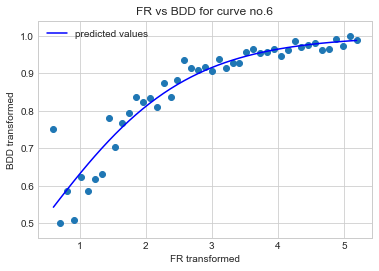

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


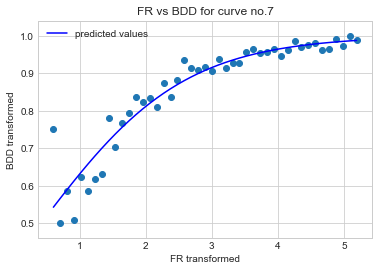

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


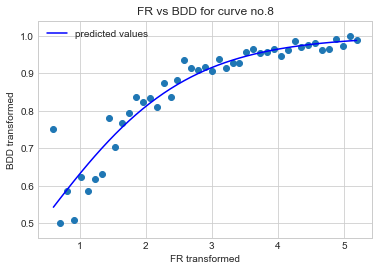

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


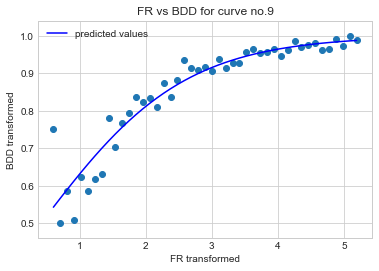

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


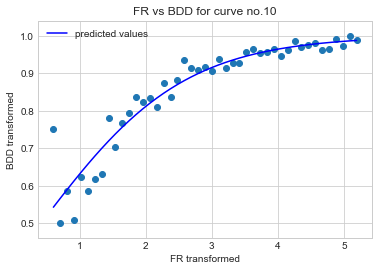

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


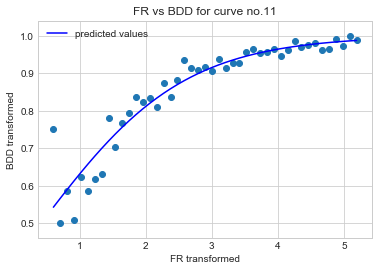

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


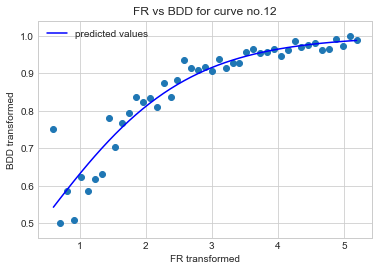

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


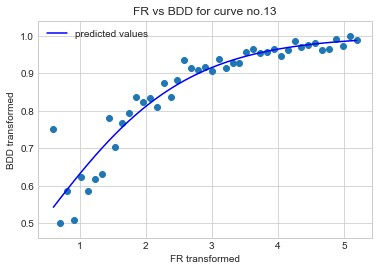

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


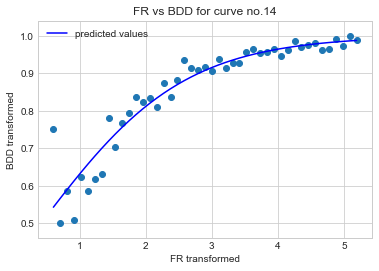

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


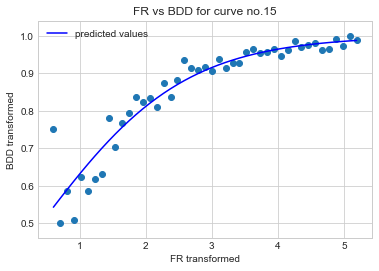

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


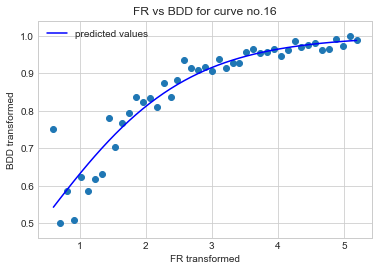

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


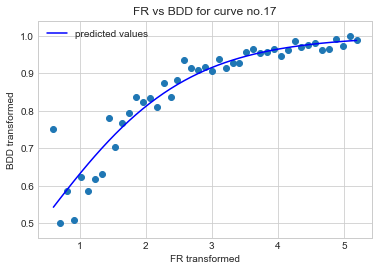

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


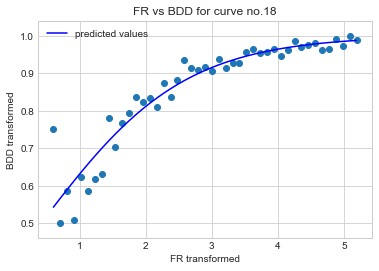

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


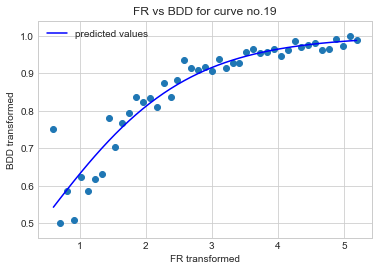

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


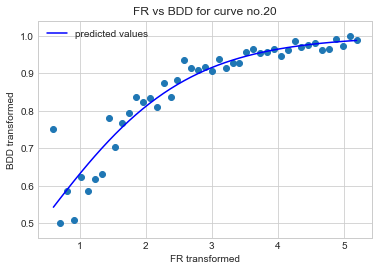

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


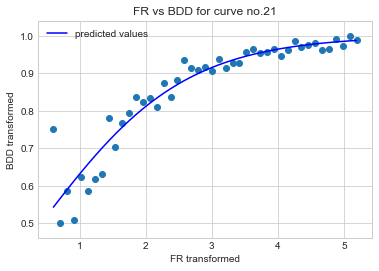

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


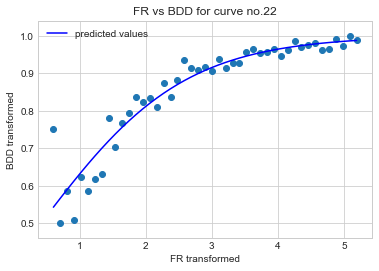

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


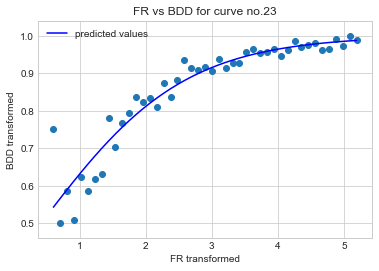

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


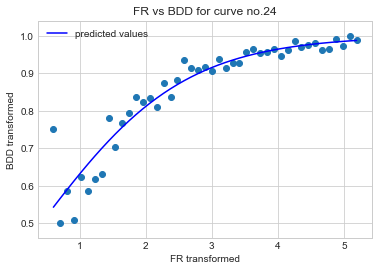

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


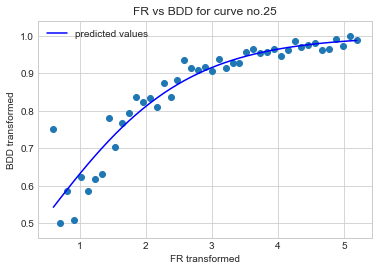

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


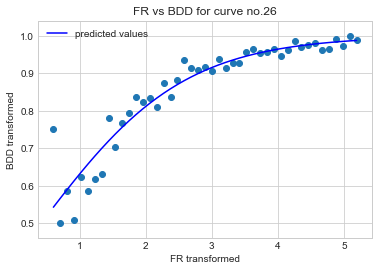

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


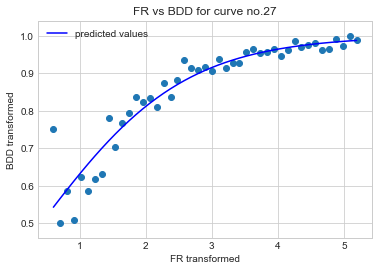

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


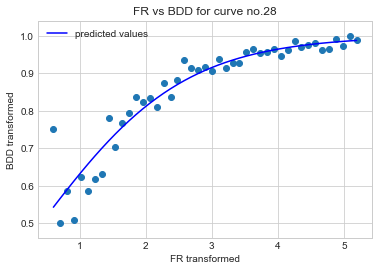

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


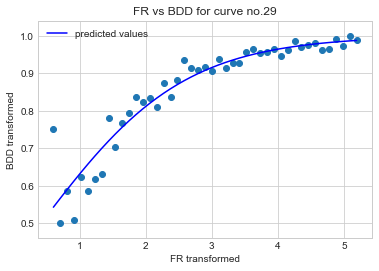

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


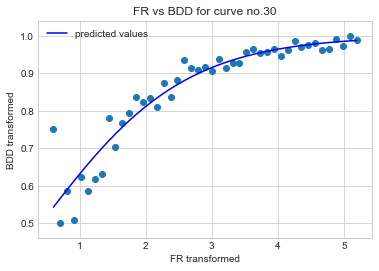

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


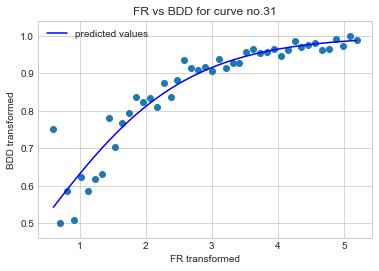

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


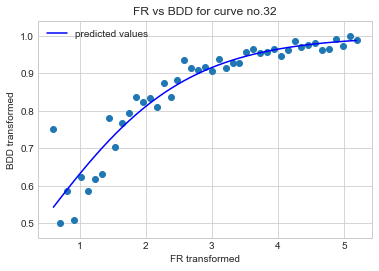

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


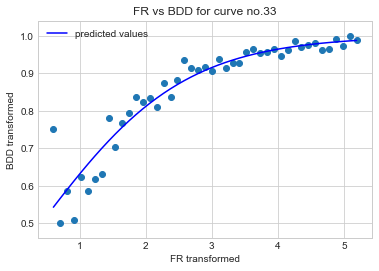

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


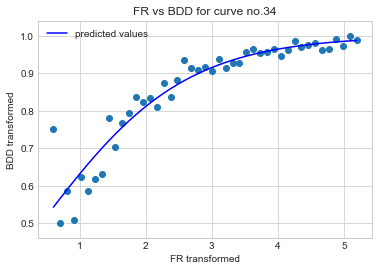

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


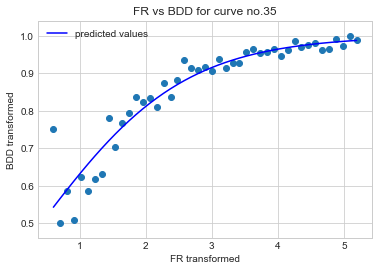

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


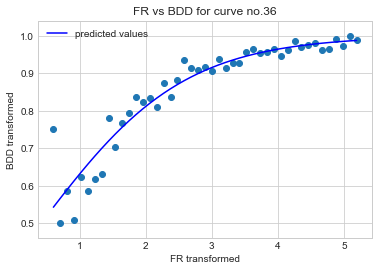

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


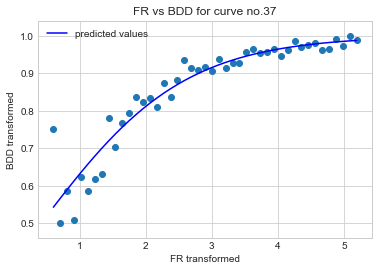

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


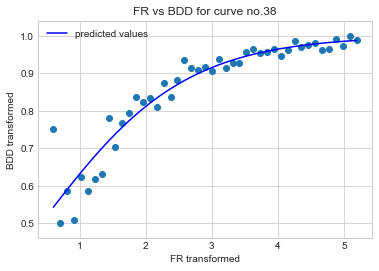

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


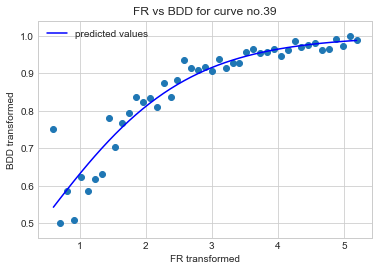

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


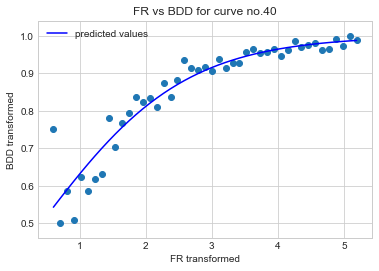

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


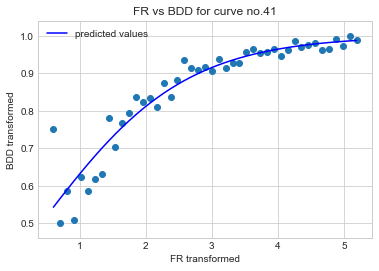

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


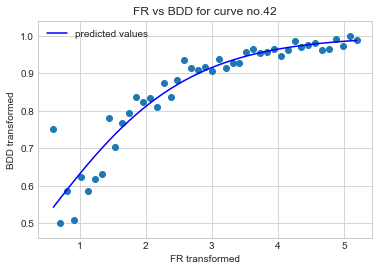

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


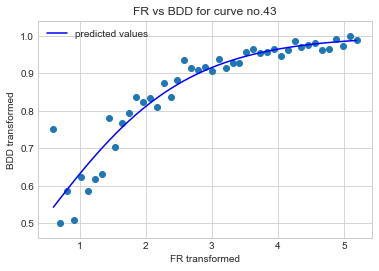

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


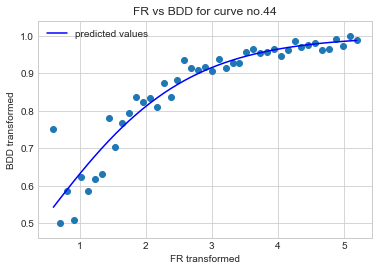

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


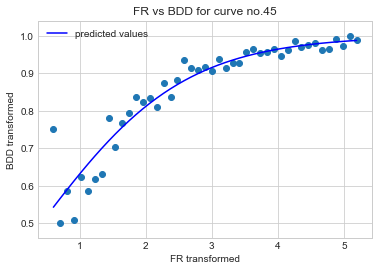

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


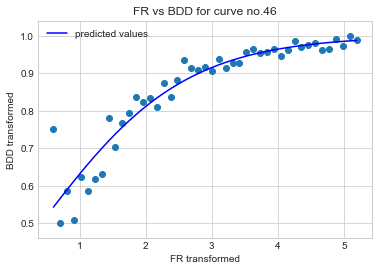

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


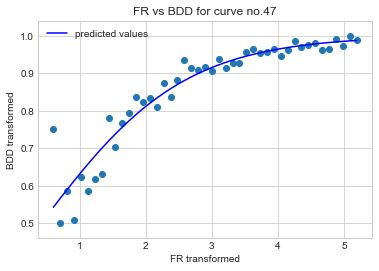

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


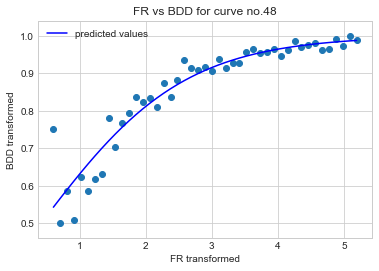

Optimization terminated successfully.
         Current function value: 0.238691
         Iterations 7


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


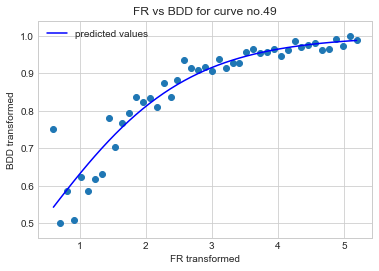

In [303]:
for c in range(50):
    fitSigmRegressionSm(c)

In [315]:
def bdd_model_sm_high(curve, fr):
    m = m_values_FRhigh1[curve] 
    c = c_values_FRhigh1[curve] 
    minbdd = min_BDD_values_FRhigh1[curve]  
    range_ = range_BDD_values_FRhigh1[curve] 
    bdd = ((2*range_)*sigmoid((m/48)*fr + c-0.4999))+ minbdd
    return bdd
    

## Regression for FR < 24: with statsmodels.api

In [305]:
import statsmodels.api as sm

r_values_FRlow1 = np.zeros(50)
mse_values_FRlow1 = np.zeros(50)
m_values_FRlow1 = np.zeros(50)
c_values_FRlow1 = np.zeros(50)
min_BDD_values_FRlow1 = np.zeros(50)
v_asymptote1 = np.zeros(50)

def fitInvSigmRegressionSm(curve):
    data = FR_test_low[FR_test_low.curve_no == curve]
    data = data[data.FR != 24]
    FR = np.array(data['FR']) #x-axis
    BDD = data['Value'] #y-axis

    def f(x):
    # return math.sqrt(x)
       return float(x)

    FR = np.array([f(xi) for xi in FR])
    BDD = np.array([f(xi) for xi in BDD])
    
    #some scaling
    min_BDD = min(BDD)
    min_BDD_values_FRlow1[curve] = min(BDD)
    fr_t = FR/48
    bdd_t = (BDD-min_BDD+0.00001)*100
    
    min_BDD_values_FRlow[curve] = min_BDD
    
    bdd_t_w_ones = sm.add_constant(bdd_t)

    plt.scatter(bdd_t, fr_t)
    
    model = sm.Logit(fr_t, bdd_t_w_ones)
    result = model.fit(method='newton')
    const, m = result.params
    result.summary()

    plt.plot(bdd_t, sigmoid(m*bdd_t + const), "b", label = 'predicted values')
    plt.show()
    
    m_values_FRlow1[curve]= m
    c_values_FRlow1[curve]= const
    
    #def bdd_model_FRlow(fr):
    #    m = m_values_FRlow1[curve]
     #   c = c_values_FRlow1[curve]
     #   minbdd = min_BDD_values_FRlow1[curve]
     #   result = inv_sigmoid_v2((m*((f-53.9)/48))+c) + minbdd
     #   return result
    
    


Optimization terminated successfully.
         Current function value: 0.512726
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


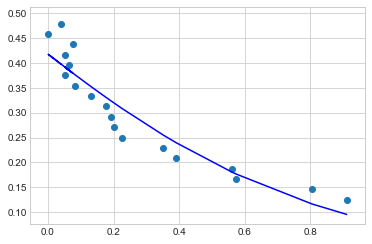

Optimization terminated successfully.
         Current function value: 0.510918
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


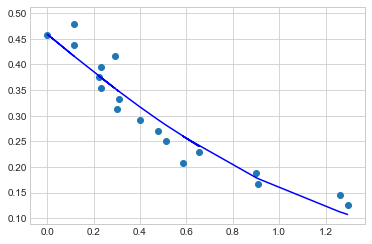

Optimization terminated successfully.
         Current function value: 0.515523
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


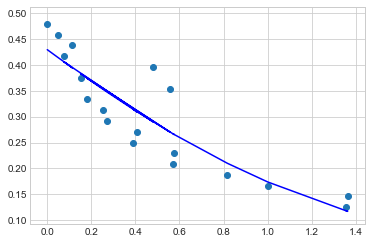

Optimization terminated successfully.
         Current function value: 0.511589
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


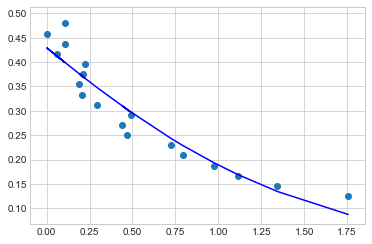

Optimization terminated successfully.
         Current function value: 0.513139
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


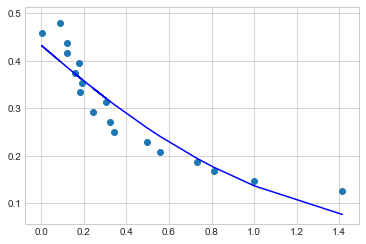

Optimization terminated successfully.
         Current function value: 0.515229
         Iterations 5


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


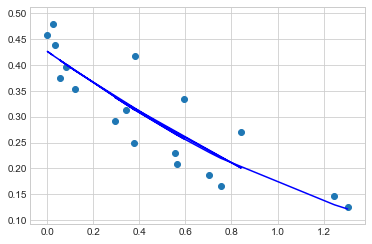

Optimization terminated successfully.
         Current function value: 0.511442
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


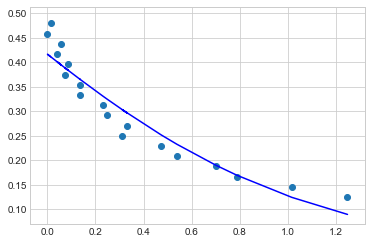

Optimization terminated successfully.
         Current function value: 0.514209
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


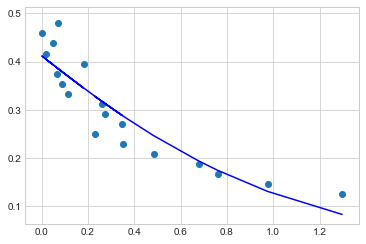

Optimization terminated successfully.
         Current function value: 0.511707
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


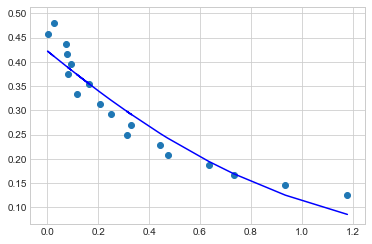

Optimization terminated successfully.
         Current function value: 0.512217
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


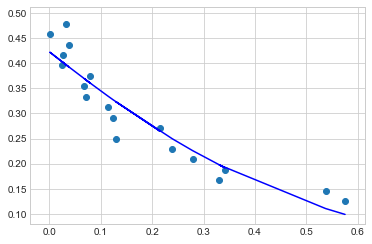

Optimization terminated successfully.
         Current function value: 0.513488
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


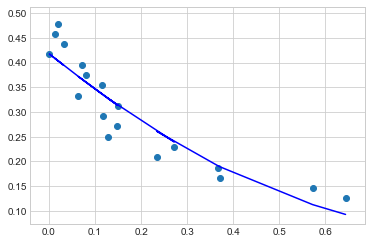

Optimization terminated successfully.
         Current function value: 0.512098
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


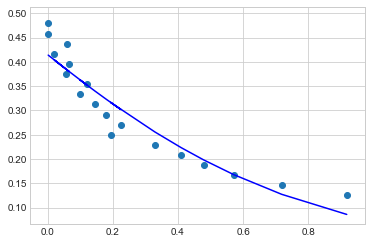

Optimization terminated successfully.
         Current function value: 0.512978
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


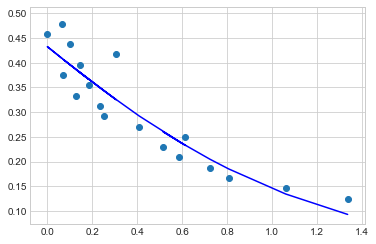

Optimization terminated successfully.
         Current function value: 0.510937
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


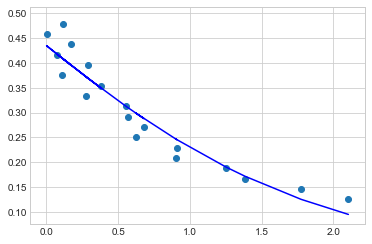

Optimization terminated successfully.
         Current function value: 0.513181
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


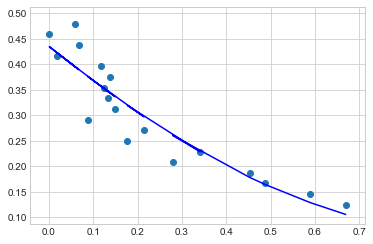

Optimization terminated successfully.
         Current function value: 0.512960
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


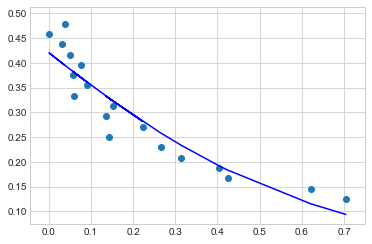

Optimization terminated successfully.
         Current function value: 0.516925
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


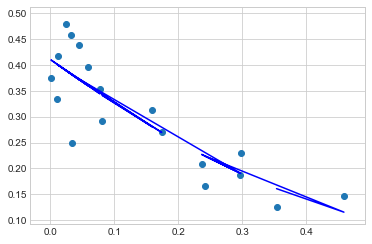

Optimization terminated successfully.
         Current function value: 0.512001
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


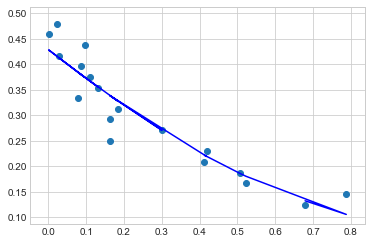

Optimization terminated successfully.
         Current function value: 0.512589
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


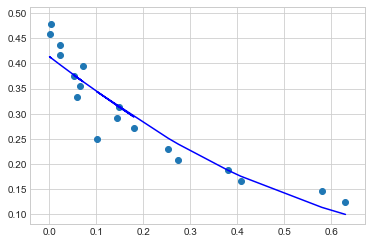

Optimization terminated successfully.
         Current function value: 0.512593
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


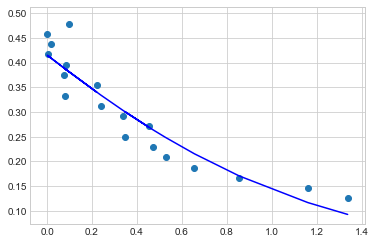

Optimization terminated successfully.
         Current function value: 0.513511
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


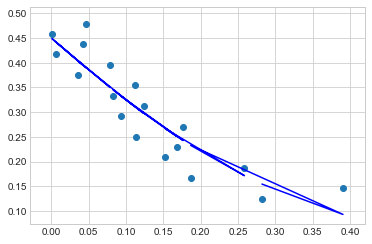

Optimization terminated successfully.
         Current function value: 0.521243
         Iterations 5


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


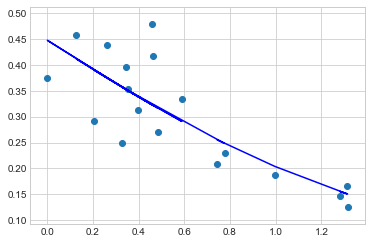

Optimization terminated successfully.
         Current function value: 0.511229
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


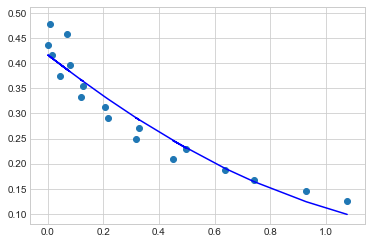

Optimization terminated successfully.
         Current function value: 0.512826
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


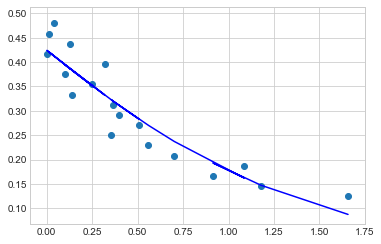

Optimization terminated successfully.
         Current function value: 0.509650
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


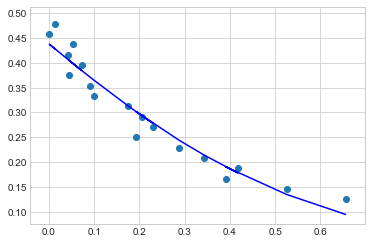

Optimization terminated successfully.
         Current function value: 0.512978
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


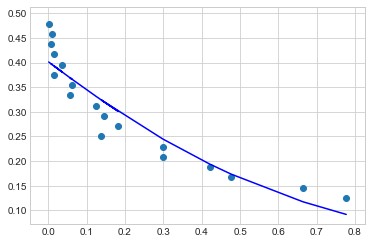

Optimization terminated successfully.
         Current function value: 0.513509
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


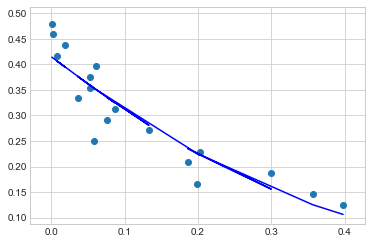

Optimization terminated successfully.
         Current function value: 0.513631
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


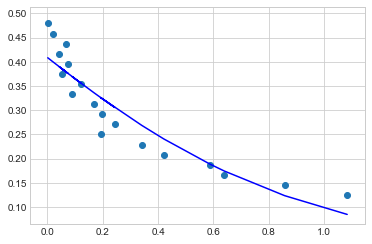

Optimization terminated successfully.
         Current function value: 0.512223
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


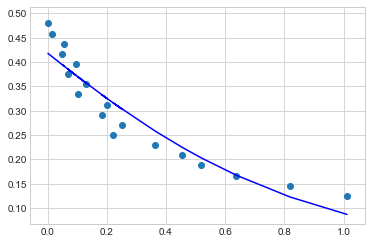

Optimization terminated successfully.
         Current function value: 0.513523
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


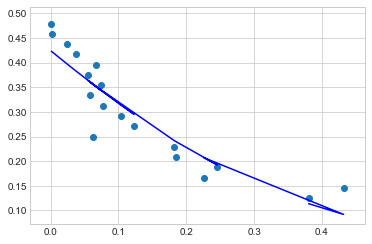

Optimization terminated successfully.
         Current function value: 0.514523
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


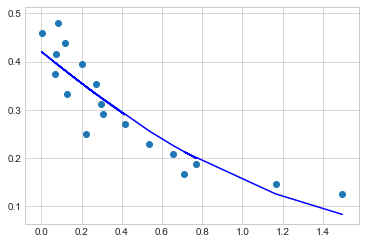

Optimization terminated successfully.
         Current function value: 0.512889
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


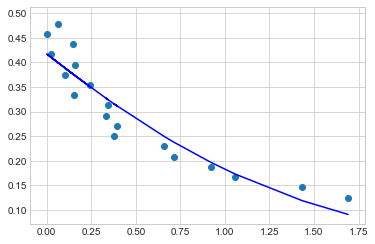

Optimization terminated successfully.
         Current function value: 0.510888
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


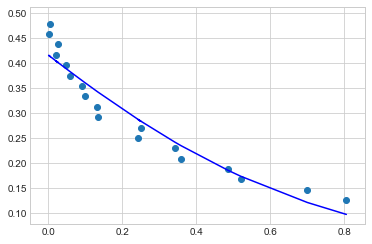

Optimization terminated successfully.
         Current function value: 0.509233
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


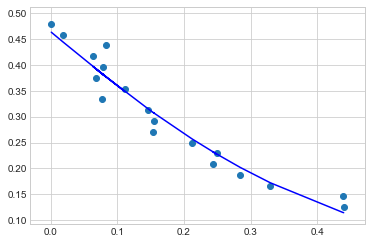

Optimization terminated successfully.
         Current function value: 0.513651
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


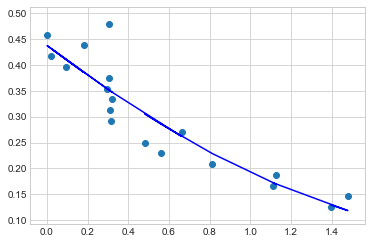

Optimization terminated successfully.
         Current function value: 0.511596
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


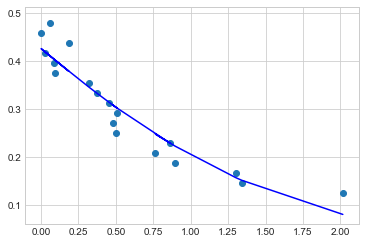

Optimization terminated successfully.
         Current function value: 0.511498
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


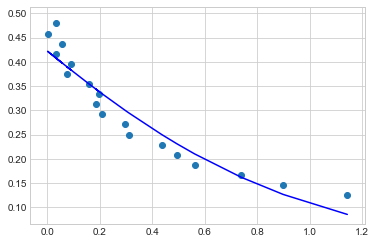

Optimization terminated successfully.
         Current function value: 0.514413
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


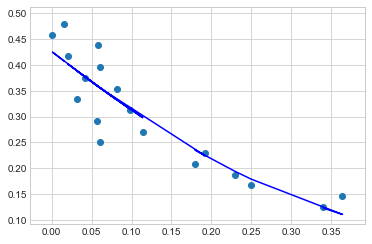

Optimization terminated successfully.
         Current function value: 0.512790
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


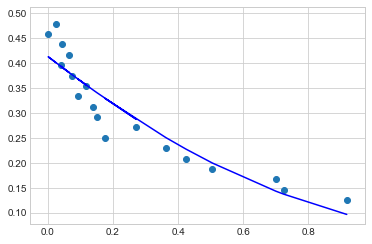

Optimization terminated successfully.
         Current function value: 0.512419
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


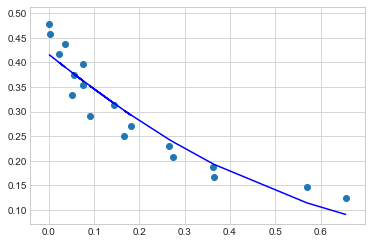

Optimization terminated successfully.
         Current function value: 0.512735
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


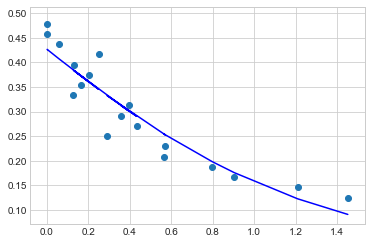

Optimization terminated successfully.
         Current function value: 0.513996
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


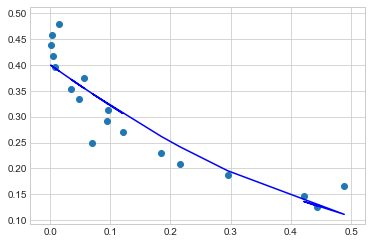

Optimization terminated successfully.
         Current function value: 0.513520
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


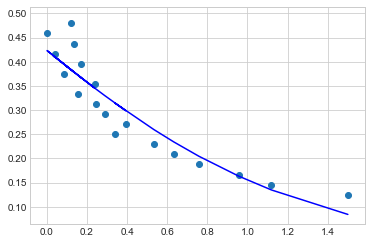

Optimization terminated successfully.
         Current function value: 0.511221
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


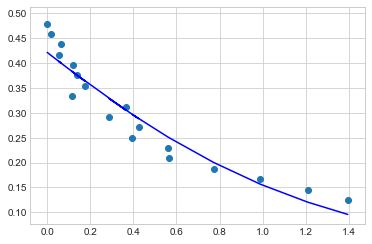

Optimization terminated successfully.
         Current function value: 0.519495
         Iterations 5


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


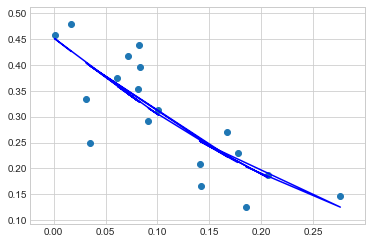

Optimization terminated successfully.
         Current function value: 0.513474
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


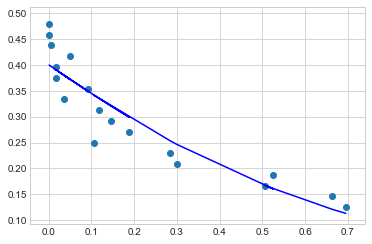

Optimization terminated successfully.
         Current function value: 0.513635
         Iterations 5


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


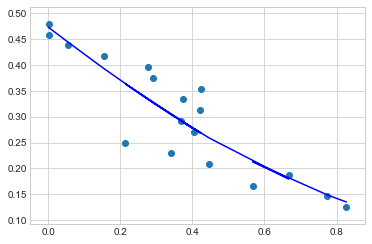

Optimization terminated successfully.
         Current function value: 0.513072
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


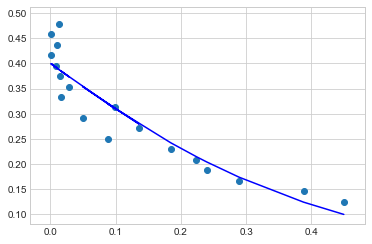

Optimization terminated successfully.
         Current function value: 0.512444
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


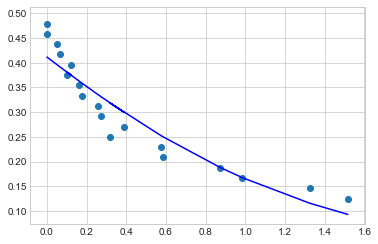

Optimization terminated successfully.
         Current function value: 0.517942
         Iterations 6


/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1747: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/opt/anaconda3/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:3409: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.llf/self.llnull


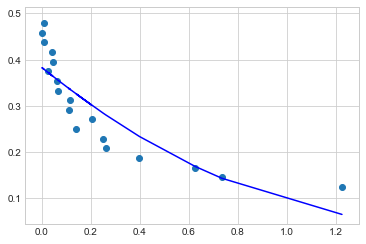

In [306]:
for c in range(50):
    fitInvSigmRegressionSm(c)

In [307]:
def bdd_model_sm_low(curve, fr):
    FR = fr/48
    m = m_values_FRlow1[curve]
    c = c_values_FRlow1[curve]
    minbdd = min_BDD_values_FRlow[curve]
    bdd = ((inv_sigmoid(FR)-c)/(100*m)) + min_BDD + 0.00001
    return bdd
    

## Regression with curve_fit

In [224]:
#REGRESSION FOR FR < 24

r_values_FRlow = np.zeros(50)
mse_values_FRlow = np.zeros(50)
m_values_FRlow = np.zeros(50)
c_values_FRlow = np.zeros(50)
min_BDD_values_FRlow = np.zeros(50)
v_asymptote = np.zeros(50)
# where y = mx + c / we want to store the gradient values to analyse them later

def fitInvSigmRegression(curve):
    data = FR_test_low[FR_test_low.curve_no == curve]
    data = data[data.FR != 24]
    FR = np.array(data['FR']) #x-axis
    BDD = data['Value'] #y-axis

    def f(x):
    # return math.sqrt(x)
       return float(x)

    FR = np.array([f(xi) for xi in FR])
    BDD = np.array([f(xi) for xi in BDD])
    
    FR = FR-53.9
    FR = FR/48
    
    min_BDD = min(BDD)
    
    #max_BDD = max(BDD)
    
    min_BDD_values_FRlow[curve] = min_BDD
    
    BDD = BDD - min_BDD
    
    #BDD = BDD*(15/max_BDD)
    
    

    sigmoid_BDD = sigmoid_v2(BDD) #
    curve_fit = np.polyfit(FR, sigmoid_BDD, 1)
    

#1. Linear transformation curve
    plt.plot(FR, curve_fit[0]*FR + curve_fit[1], label = 'predicted values')
    plt.plot(FR, sigmoid_BDD, "o", label = 'actual values')
    plt.title("FR vs sigmoid(BDD) for curve no." + str(curve))
    plt.xlabel('FR')
    plt.ylabel('sigmoid(BDD)')
    plt.legend()
    plt.show()

#equation fo the line: log(BDD) = curve_fit[0] * FR + curve_fit[1]

    sigmoid_BDD_pred = curve_fit[0] * FR + curve_fit[1]
    print('Equation of the line of best fit for curve no. '+str(curve)+': '+'sigmoid_BDD_pred = '+str(curve_fit[0])+ '*FR '+'+ '+str(curve_fit[1]))


        
#correlation coef (Pearson's r):
    r_matrix = np.corrcoef(FR, sigmoid_BDD)
    r = r_matrix[0, 1]
    print('The correlation coeffcient for FR and log(BDD) is equal to r =' + str(r))
    r_values_FRlow[curve] = r

#mean-squared-error
    mse = mean_squared_error(sigmoid_BDD, sigmoid_BDD_pred) 
    print('The Mean-Squared Error is equal to ' + str(mse))
    mse_values_FRlow[curve]=mse
    
#store line data
    m_values_FRlow[curve]=curve_fit[0]
    c_values_FRlow[curve]=curve_fit[1]
    
    def bdd_model_FRlow(fr):
        m = m_values_FRlow[curve]
        c = c_values_FRlow[curve]
        minbdd = min_BDD_values_FRlow[curve]
        result = inv_sigmoid_v2((m*((f-53.9)/48))+c) + minbdd
        return result
    
    pred_val = []
    for f in range(0, 24, 1):
        pred_val.append(bdd_model_FRlow(f/10))
   
    max_pred_val = max(pred_val)
    idx = pred_val.index(max_pred_val)
    fr_asymptote = idx * 0.1
    v_asymptote[curve] = fr_asymptote
        

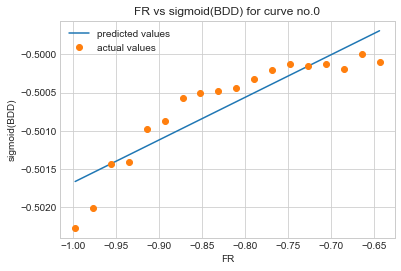

Equation of the line of best fit for curve no. 0: sigmoid_BDD_pred = 0.005561102106823861*FR + -0.49611124413554053
The correlation coeffcient for FR and log(BDD) is equal to r =0.9050158871691165
The Mean-Squared Error is equal to 7.981742378472714e-08


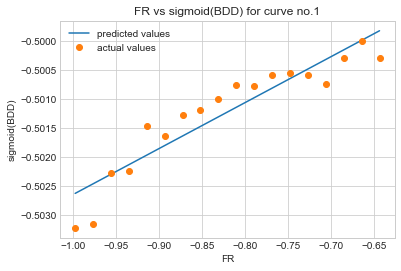

Equation of the line of best fit for curve no. 1: sigmoid_BDD_pred = 0.00794357948231756*FR + -0.49470119799515816
The correlation coeffcient for FR and log(BDD) is equal to r =0.9285160181143028
The Mean-Squared Error is equal to 1.178757525119083e-07


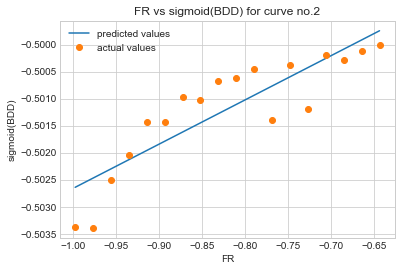

Equation of the line of best fit for curve no. 2: sigmoid_BDD_pred = 0.008177960994838704*FR + -0.49448088141775765
The correlation coeffcient for FR and log(BDD) is equal to r =0.870258555162866
The Mean-Squared Error is equal to 2.5032985543999984e-07


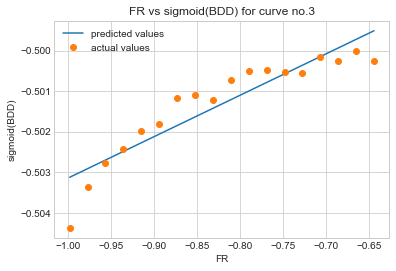

Equation of the line of best fit for curve no. 3: sigmoid_BDD_pred = 0.010211776428446635*FR + -0.4929359034169199
The correlation coeffcient for FR and log(BDD) is equal to r =0.9180641221052623
The Mean-Squared Error is equal to 2.2716038685222058e-07


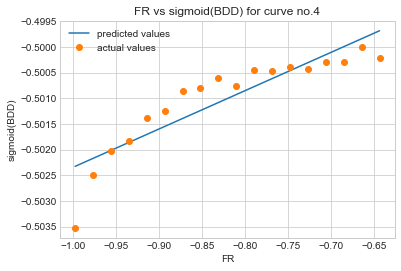

Equation of the line of best fit for curve no. 4: sigmoid_BDD_pred = 0.00746046432076717*FR + -0.4948810505893409
The correlation coeffcient for FR and log(BDD) is equal to r =0.8899883594515056
The Mean-Squared Error is equal to 1.70686681441844e-07


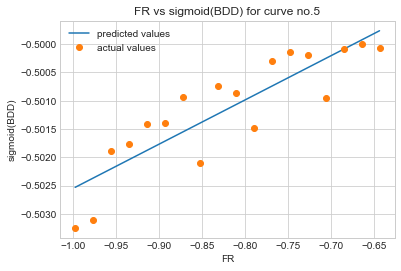

Equation of the line of best fit for curve no. 5: sigmoid_BDD_pred = 0.007818456308461333*FR + -0.49472906720842735
The correlation coeffcient for FR and log(BDD) is equal to r =0.8696641176656543
The Mean-Squared Error is equal to 2.3009401125218022e-07


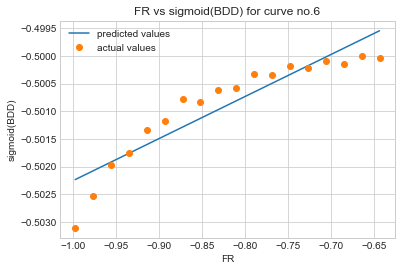

Equation of the line of best fit for curve no. 6: sigmoid_BDD_pred = 0.007582378046353076*FR + -0.4946670445587144
The correlation coeffcient for FR and log(BDD) is equal to r =0.9194243654036208
The Mean-Squared Error is equal to 1.228831654288633e-07


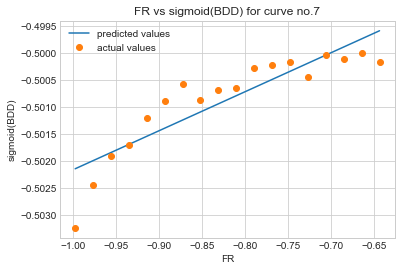

Equation of the line of best fit for curve no. 7: sigmoid_BDD_pred = 0.007193483012699549*FR + -0.494960280434722
The correlation coeffcient for FR and log(BDD) is equal to r =0.8811842704174331
The Mean-Squared Error is equal to 1.740159479830757e-07


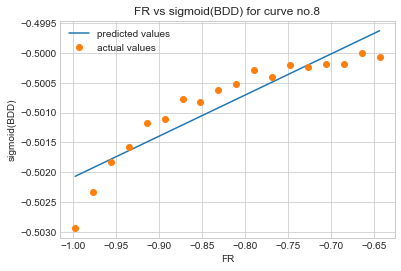

Equation of the line of best fit for curve no. 8: sigmoid_BDD_pred = 0.00690279920532045*FR + -0.49518123296106725
The correlation coeffcient for FR and log(BDD) is equal to r =0.9138472486919633
The Mean-Squared Error is equal to 1.09905262672335e-07


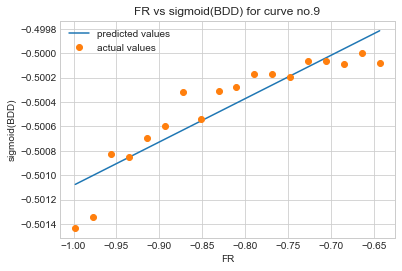

Equation of the line of best fit for curve no. 9: sigmoid_BDD_pred = 0.0035541888798284555*FR + -0.49752833703131133
The correlation coeffcient for FR and log(BDD) is equal to r =0.9096851592926033
The Mean-Squared Error is equal to 3.0758027656394863e-08


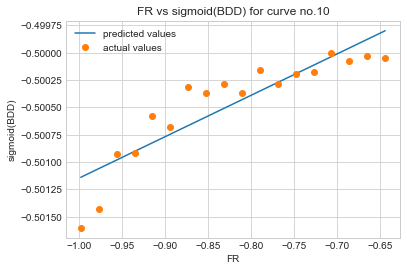

Equation of the line of best fit for curve no. 10: sigmoid_BDD_pred = 0.003783307146773493*FR + -0.4973636955096588
The correlation coeffcient for FR and log(BDD) is equal to r =0.8908244404675231
The Mean-Squared Error is equal to 4.3498510848977914e-08


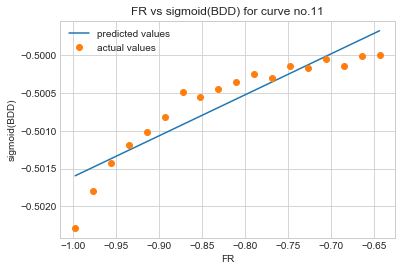

Equation of the line of best fit for curve no. 11: sigmoid_BDD_pred = 0.005429907511957289*FR + -0.49617706479271606
The correlation coeffcient for FR and log(BDD) is equal to r =0.9098226602451921
The Mean-Squared Error is equal to 7.166393133096955e-08


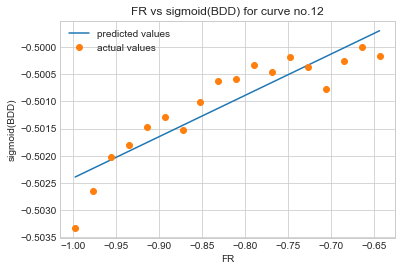

Equation of the line of best fit for curve no. 12: sigmoid_BDD_pred = 0.007594173051844228*FR + -0.4948121969927974
The correlation coeffcient for FR and log(BDD) is equal to r =0.9033333579406199
The Mean-Squared Error is equal to 1.519130824665191e-07


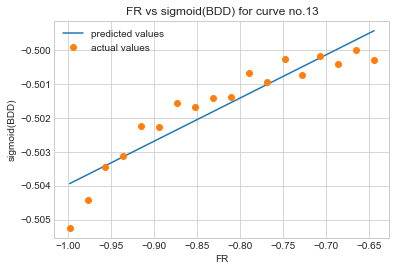

Equation of the line of best fit for curve no. 13: sigmoid_BDD_pred = 0.01271684099431437*FR + -0.4912495548653202
The correlation coeffcient for FR and log(BDD) is equal to r =0.9276501001071206
The Mean-Squared Error is equal to 3.06192840671652e-07


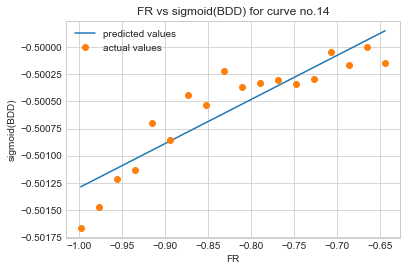

Equation of the line of best fit for curve no. 14: sigmoid_BDD_pred = 0.004058478719896933*FR + -0.4972368055571361
The correlation coeffcient for FR and log(BDD) is equal to r =0.9043605361940766
The Mean-Squared Error is equal to 4.285173871414636e-08


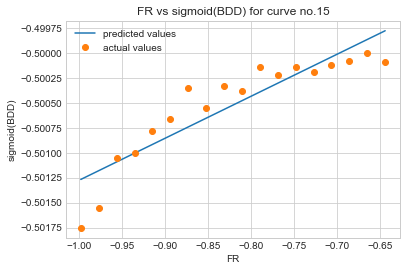

Equation of the line of best fit for curve no. 15: sigmoid_BDD_pred = 0.004200797443876132*FR + -0.49707577405993975
The correlation coeffcient for FR and log(BDD) is equal to r =0.900650820203599
The Mean-Squared Error is equal to 4.799058116544013e-08


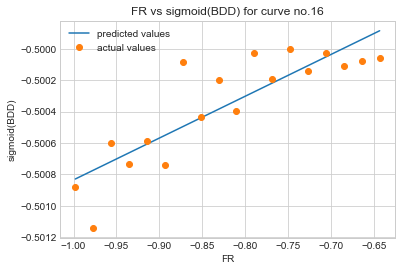

Equation of the line of best fit for curve no. 16: sigmoid_BDD_pred = 0.0026643206368798414*FR + -0.49817049862968366
The correlation coeffcient for FR and log(BDD) is equal to r =0.8533314502908081
The Mean-Squared Error is equal to 3.095753464615925e-08


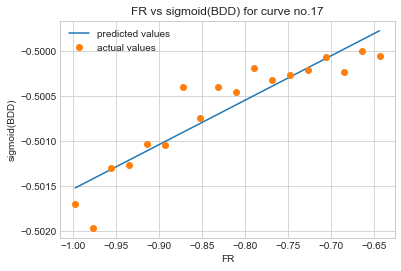

Equation of the line of best fit for curve no. 17: sigmoid_BDD_pred = 0.004911713744348886*FR + -0.49661739634070134
The correlation coeffcient for FR and log(BDD) is equal to r =0.917088835537609
The Mean-Squared Error is equal to 5.3264436585960776e-08


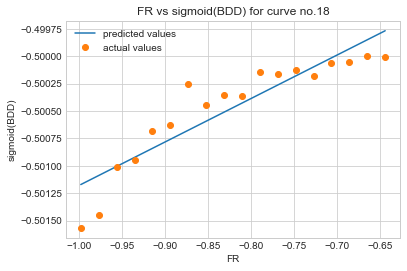

Equation of the line of best fit for curve no. 18: sigmoid_BDD_pred = 0.003964024999700608*FR + -0.4972155357392528
The correlation coeffcient for FR and log(BDD) is equal to r =0.9067130764504631
The Mean-Squared Error is equal to 3.971713644603775e-08


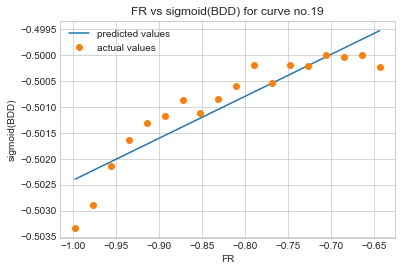

Equation of the line of best fit for curve no. 19: sigmoid_BDD_pred = 0.008069297907833204*FR + -0.49434214416610917
The correlation coeffcient for FR and log(BDD) is equal to r =0.9044776569152091
The Mean-Squared Error is equal to 1.6915913777919268e-07


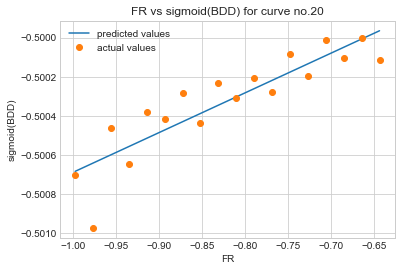

Equation of the line of best fit for curve no. 20: sigmoid_BDD_pred = 0.0020259101370355696*FR + -0.49866132422422166
The correlation coeffcient for FR and log(BDD) is equal to r =0.8822105581490198
The Mean-Squared Error is equal to 1.3658695512972059e-08


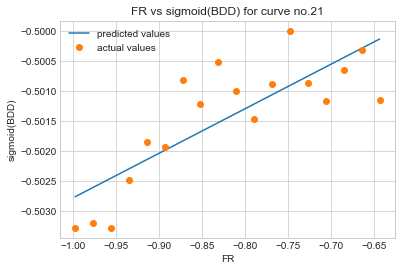

Equation of the line of best fit for curve no. 21: sigmoid_BDD_pred = 0.0073944483795613716*FR + -0.4953779639807062
The correlation coeffcient for FR and log(BDD) is equal to r =0.8072479480217183
The Mean-Squared Error is equal to 3.41470519645892e-07


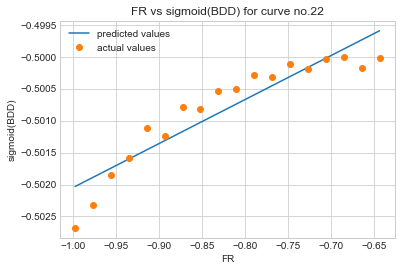

Equation of the line of best fit for curve no. 22: sigmoid_BDD_pred = 0.006879896035101796*FR + -0.4951650095915551
The correlation coeffcient for FR and log(BDD) is equal to r =0.9265760243554522
The Mean-Squared Error is equal to 9.110967202810356e-08


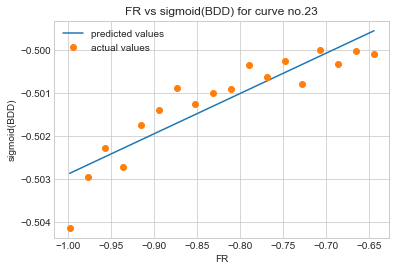

Equation of the line of best fit for curve no. 23: sigmoid_BDD_pred = 0.009342928423525262*FR + -0.493539516311644
The correlation coeffcient for FR and log(BDD) is equal to r =0.9000675829093338
The Mean-Squared Error is equal to 2.390176899829767e-07


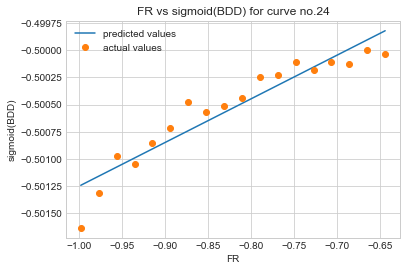

Equation of the line of best fit for curve no. 24: sigmoid_BDD_pred = 0.004007669780143082*FR + -0.4972423030736294
The correlation coeffcient for FR and log(BDD) is equal to r =0.9436448647712674
The Mean-Squared Error is equal to 2.3081068551827425e-08


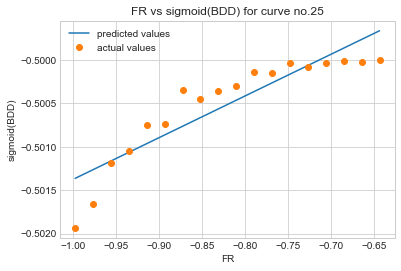

Equation of the line of best fit for curve no. 25: sigmoid_BDD_pred = 0.004792243954747448*FR + -0.4965820855056325
The correlation coeffcient for FR and log(BDD) is equal to r =0.9006178385176413
The Mean-Squared Error is equal to 6.247967870369099e-08


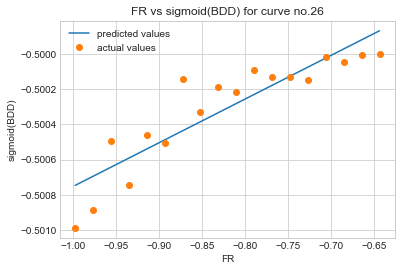

Equation of the line of best fit for curve no. 26: sigmoid_BDD_pred = 0.002484237492290278*FR + -0.49826755075059964
The correlation coeffcient for FR and log(BDD) is equal to r =0.8946204129896178
The Mean-Squared Error is equal to 1.798564937803194e-08


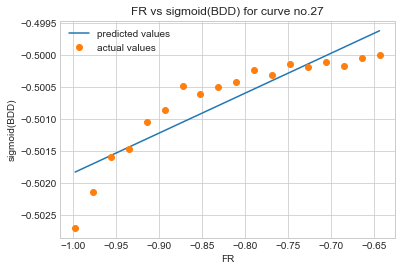

Equation of the line of best fit for curve no. 27: sigmoid_BDD_pred = 0.0062439696282190526*FR + -0.4955938601099886
The correlation coeffcient for FR and log(BDD) is equal to r =0.8894246471254285
The Mean-Squared Error is equal to 1.202901192359286e-07


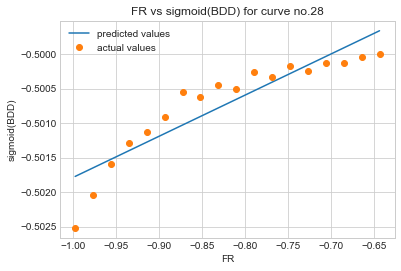

Equation of the line of best fit for curve no. 28: sigmoid_BDD_pred = 0.005959908922969023*FR + -0.49582512683340596
The correlation coeffcient for FR and log(BDD) is equal to r =0.9078912290715314
The Mean-Squared Error is equal to 8.847182895100432e-08


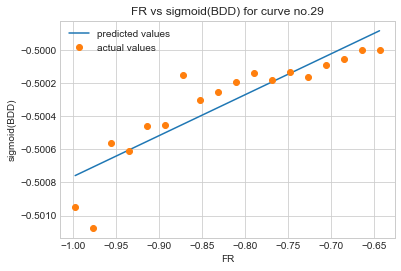

Equation of the line of best fit for curve no. 29: sigmoid_BDD_pred = 0.0024672000258959873*FR + -0.49829655715233284
The correlation coeffcient for FR and log(BDD) is equal to r =0.8860690758795184
The Mean-Squared Error is equal to 1.9463080471509734e-08


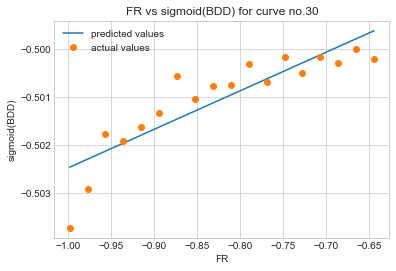

Equation of the line of best fit for curve no. 30: sigmoid_BDD_pred = 0.00803444913302753*FR + -0.49444636935424285
The correlation coeffcient for FR and log(BDD) is equal to r =0.8745453455103452
The Mean-Squared Error is equal to 2.318830885834115e-07


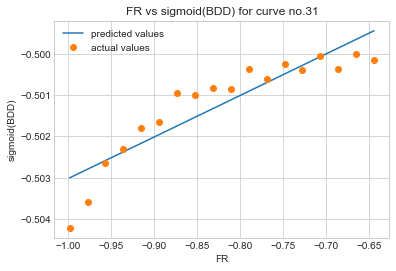

Equation of the line of best fit for curve no. 31: sigmoid_BDD_pred = 0.010048015964210913*FR + -0.49297447425525454
The correlation coeffcient for FR and log(BDD) is equal to r =0.9016557451357541
The Mean-Squared Error is equal to 2.7133062783604776e-07


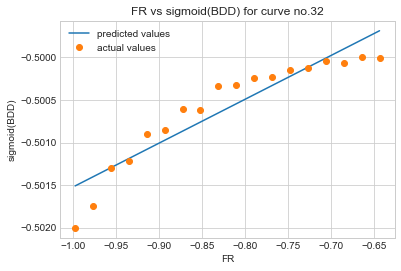

Equation of the line of best fit for curve no. 32: sigmoid_BDD_pred = 0.005151949278894062*FR + -0.49636908755809506
The correlation coeffcient for FR and log(BDD) is equal to r =0.9291320028177192
The Mean-Squared Error is equal to 4.910652762283848e-08


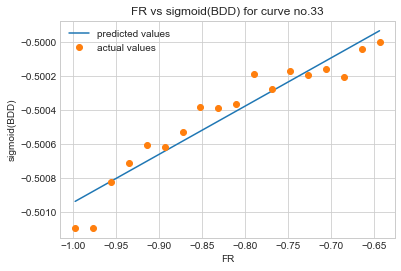

Equation of the line of best fit for curve no. 33: sigmoid_BDD_pred = 0.0028336999357966484*FR + -0.49810922558672804
The correlation coeffcient for FR and log(BDD) is equal to r =0.9517941897736184
The Mean-Squared Error is equal to 9.743025318430777e-09


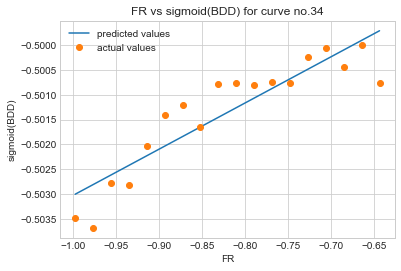

Equation of the line of best fit for curve no. 34: sigmoid_BDD_pred = 0.009310100647367672*FR + -0.49371392251565593
The correlation coeffcient for FR and log(BDD) is equal to r =0.9015316928946802
The Mean-Squared Error is equal to 2.3328434505262864e-07


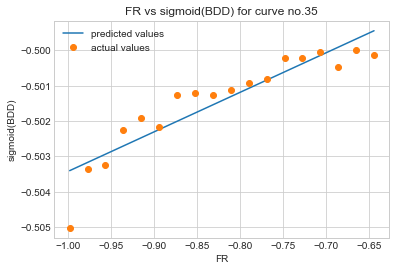

Equation of the line of best fit for curve no. 35: sigmoid_BDD_pred = 0.011181032072948129*FR + -0.4922457305487591
The correlation coeffcient for FR and log(BDD) is equal to r =0.9102121571079071
The Mean-Squared Error is equal to 3.0235452120307164e-07


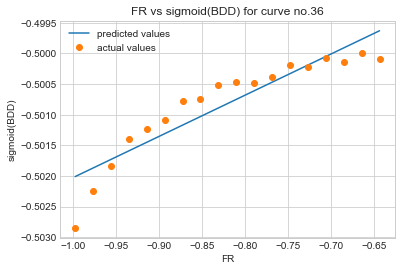

Equation of the line of best fit for curve no. 36: sigmoid_BDD_pred = 0.006723253776628034*FR + -0.4953012769200739
The correlation coeffcient for FR and log(BDD) is equal to r =0.9162104346923924
The Mean-Squared Error is equal to 1.0100444377843168e-07


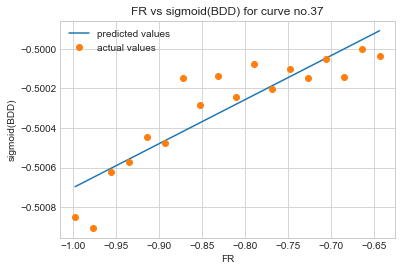

Equation of the line of best fit for curve no. 37: sigmoid_BDD_pred = 0.0022274051394653945*FR + -0.4984739195985113
The correlation coeffcient for FR and log(BDD) is equal to r =0.8885729984607678
The Mean-Squared Error is equal to 1.5448105706542704e-08


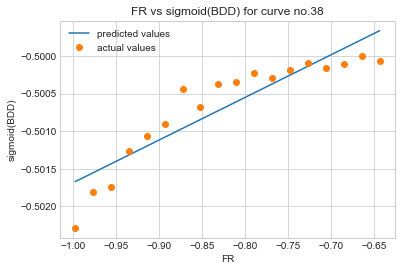

Equation of the line of best fit for curve no. 38: sigmoid_BDD_pred = 0.00565992754552529*FR + -0.4960221680650372
The correlation coeffcient for FR and log(BDD) is equal to r =0.9068505976477717
The Mean-Squared Error is equal to 8.083246034415168e-08


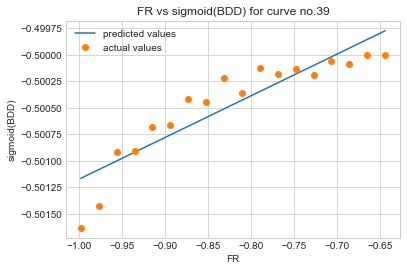

Equation of the line of best fit for curve no. 39: sigmoid_BDD_pred = 0.003926177060306228*FR + -0.49724560721536193
The correlation coeffcient for FR and log(BDD) is equal to r =0.9049267026252392
The Mean-Squared Error is equal to 3.982800775926181e-08


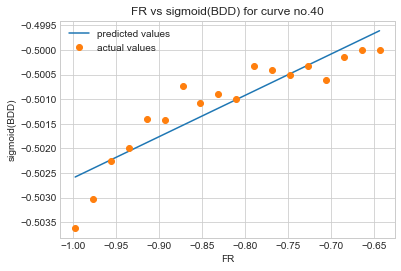

Equation of the line of best fit for curve no. 40: sigmoid_BDD_pred = 0.008389236103760205*FR + -0.4942102028491606
The correlation coeffcient for FR and log(BDD) is equal to r =0.9017977810326756
The Mean-Squared Error is equal to 1.8882128496221026e-07


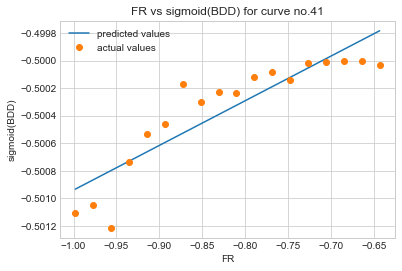

Equation of the line of best fit for curve no. 41: sigmoid_BDD_pred = 0.0032474834003286394*FR + -0.49769336150931054
The correlation coeffcient for FR and log(BDD) is equal to r =0.8891555219124931
The Mean-Squared Error is equal to 3.263314992587468e-08


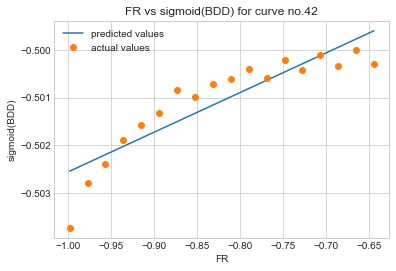

Equation of the line of best fit for curve no. 42: sigmoid_BDD_pred = 0.008333579646762939*FR + -0.4942295724019969
The correlation coeffcient for FR and log(BDD) is equal to r =0.892260987850555
The Mean-Squared Error is equal to 2.0776490884174785e-07


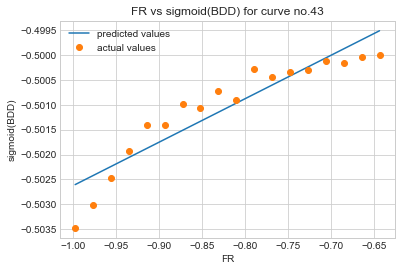

Equation of the line of best fit for curve no. 43: sigmoid_BDD_pred = 0.008712871381114345*FR + -0.49390814736615735
The correlation coeffcient for FR and log(BDD) is equal to r =0.9231424320702226
The Mean-Squared Error is equal to 1.538232801443308e-07


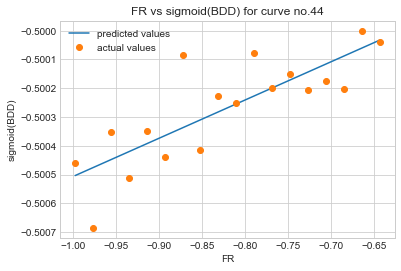

Equation of the line of best fit for curve no. 44: sigmoid_BDD_pred = 0.0013291696409080155*FR + -0.49917724368308863
The correlation coeffcient for FR and log(BDD) is equal to r =0.8080933860665845
The Mean-Squared Error is equal to 1.0966986871180709e-08


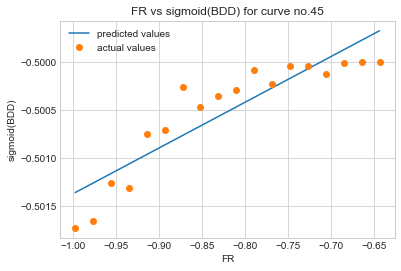

Equation of the line of best fit for curve no. 45: sigmoid_BDD_pred = 0.004765181647256931*FR + -0.4966070019954441
The correlation coeffcient for FR and log(BDD) is equal to r =0.9009190707948125
The Mean-Squared Error is equal to 6.155734221583892e-08


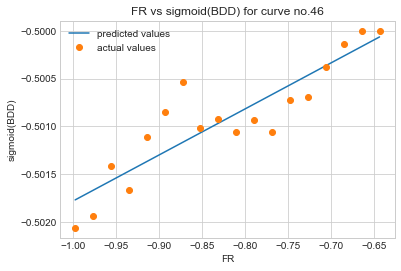

Equation of the line of best fit for curve no. 46: sigmoid_BDD_pred = 0.004809410451566607*FR + -0.49696859345773436
The correlation coeffcient for FR and log(BDD) is equal to r =0.8952386925730271
The Mean-Squared Error is equal to 6.694368617829468e-08


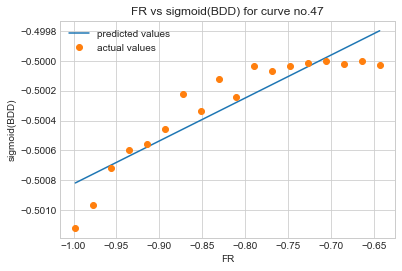

Equation of the line of best fit for curve no. 47: sigmoid_BDD_pred = 0.0028772789431825312*FR + -0.49794667246350605
The correlation coeffcient for FR and log(BDD) is equal to r =0.9054898465199702
The Mean-Squared Error is equal to 2.1243236011142016e-08


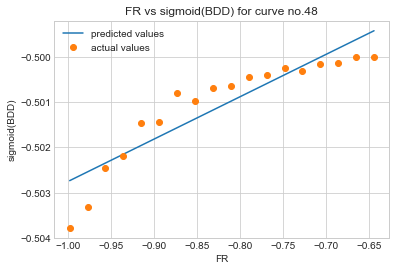

Equation of the line of best fit for curve no. 48: sigmoid_BDD_pred = 0.009350678657353818*FR + -0.49340294692098446
The correlation coeffcient for FR and log(BDD) is equal to r =0.9064781462510522
The Mean-Squared Error is equal to 2.2164366740320553e-07


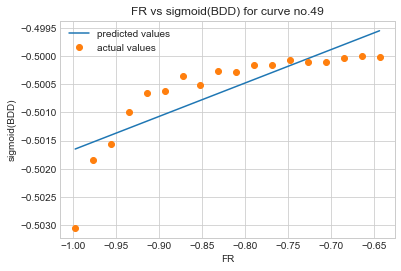

Equation of the line of best fit for curve no. 49: sigmoid_BDD_pred = 0.005939058138152851*FR + -0.4957238902748825
The correlation coeffcient for FR and log(BDD) is equal to r =0.8155325844871627
The Mean-Squared Error is equal to 2.0749853271743158e-07
[0.90501589 0.92851602 0.87025856 0.91806412 0.88998836 0.86966412
 0.91942437 0.88118427 0.91384725 0.90968516 0.89082444 0.90982266
 0.90333336 0.9276501  0.90436054 0.90065082 0.85333145 0.91708884
 0.90671308 0.90447766 0.88221056 0.80724795 0.92657602 0.90006758
 0.94364486 0.90061784 0.89462041 0.88942465 0.90789123 0.88606908
 0.87454535 0.90165575 0.929132   0.95179419 0.90153169 0.91021216
 0.91621043 0.888573   0.9068506  0.9049267  0.90179778 0.88915552
 0.89226099 0.92314243 0.80809339 0.90091907 0.89523869 0.90548985
 0.90647815 0.81553258]
[7.98174238e-08 1.17875753e-07 2.50329855e-07 2.27160387e-07
 1.70686681e-07 2.30094011e-07 1.22883165e-07 1.74015948e-07
 1.09905263e-07 3.07580277e-08 4.34985108e-08 7.16639313e-08
 1

In [225]:
for i in range(50):
    fitInvSigmRegression(i)
    
print(r_values_FRlow)
print(mse_values_FRlow)


In [128]:
v_asymptote

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

## Plots for logistic/logit regressions with sm

In [316]:
def PlotReg(curve):
    data1 = FR_test_low[FR_test_low.curve_no == curve]
    data1 = data1[data1.FR != 24]
    FR1 = np.array(data1['FR']) #x-axis
    BDD1 = data1['Value'] #y-axis

    def f(x):
    # return math.sqrt(x)
       return float(x)

    FR1 = np.array([f(xi) for xi in FR1])
    BDD1 = np.array([f(xi) for xi in BDD1])
    
    #bdd_model_sm_low(curve, fr)
    
    FR_list1 = FR1.tolist()
    BDD_list1 = BDD1.tolist()
    
    plt.scatter(FR1, BDD1, c = 'g', label = 'FR vs BDD for curve ' + str(curve) + ', for FR < 24')
    plt.ylim(0, max(BDD_list1)+0.0005)
    plt.xlim(0, 254)
    t1 = np.arange(6.0, 23.99, 0.01)
    plt.plot(t1, bdd_model_sm_low(curve, t1), c = 'm', label = 'model')
    
    data2 = FR_test_high[FR_test_high.curve_no == curve]
    data2 = data2[data2.FR != 24]
    FR2 = np.array(data2['FR']) #x-axis
    BDD2 = data2['Value'] #y-axis

    def f(x):
    # return math.sqrt(x)
       return float(x)

    FR2 = np.array([f(xi) for xi in FR2])
    BDD2 = np.array([f(xi) for xi in BDD2])
    
    #bdd_model_sm_low(curve, fr)
    
    FR_list2 = FR2.tolist()
    BDD_list2 = BDD2.tolist()
    
    plt.scatter(FR2, BDD2, c = 'r', label = 'FR vs BDD for curve ' + str(curve) + ', for FR > 24')
    
    t2 = np.arange(24.0, 254.0, 0.01)
    plt.plot(t2, bdd_model_sm_high(curve, t2), c = 'b', label = 'model')
    
    plt.show()


    


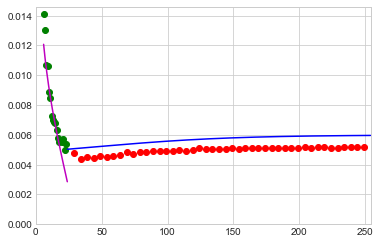

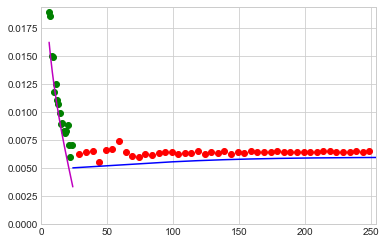

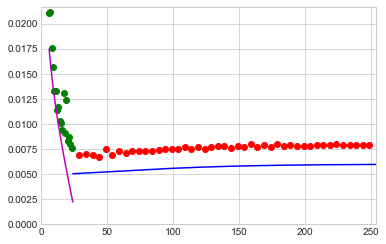

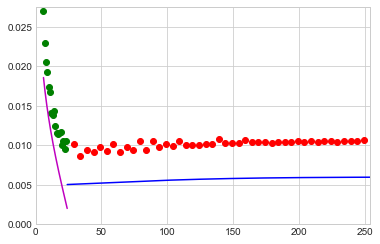

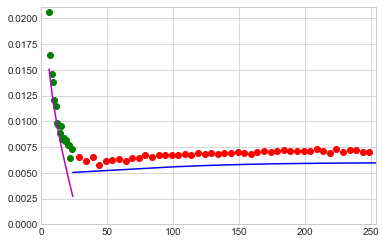

...

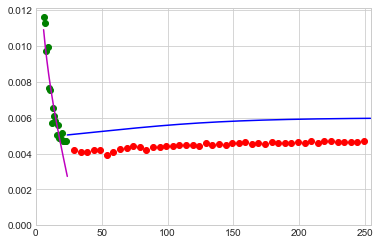

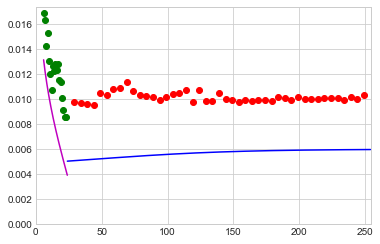

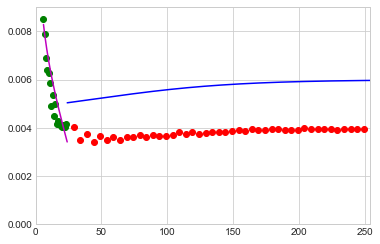

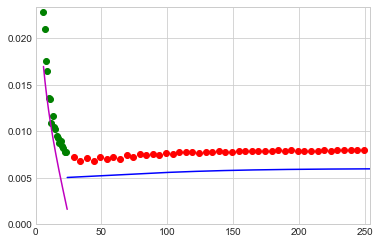

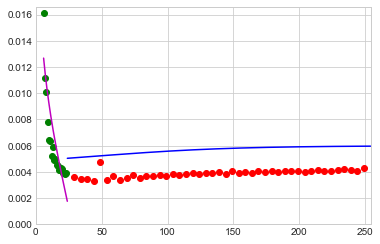

In [317]:
for c in range(50):
    PlotReg(c)

## Convergence tests

In [ ]:
#def convergence_test by checking if the distance (abs value) between BDD and horizontal asymptote is decreasing

In [166]:
#CONVERGENCE TEST
def convergence_test_FR(curve, epsilon):

    data = FR_test_high[FR_test_high.curve_no == curve]
    data = data[data.FR != 24]
    FR = np.array(data['FR']) #x-axis
    BDD = data['Value']
    FR_list = FR.tolist()
    BDD_list = BDD.tolist()
    E_idx = FR_list.index(epsilon)
    maxi = len(FR_list)
    l = FR_list

    asymptote = h_asymptote_FRhigh[curve]   
        #print(E_idx)
    
    def BDD_d(i):
        if i > 0 and i < len(BDD_list):
            d = np.abs(BDD_list[i]- asymptote)
            return (d)
    
    BDD_diff = []
    for idx in range(E_idx, maxi, 1):
        BDD_diff.append(BDD_d(idx))
        
    x_axis = l[E_idx:]
    #list(range(epsilon, FR_list[-1], 4))
    plt.scatter(x_axis, BDD_diff, label = 'difference between BDD value and horizontal asymptote for consecutive FR values for curve '+ str(curve))
    plt.legend()
    plt.ylim(0, max(BDD_diff))
    

    plt.show()
        

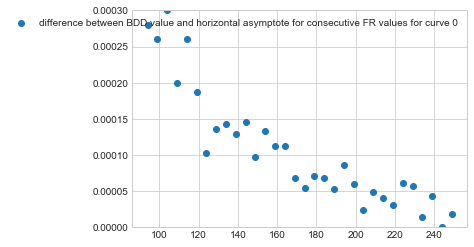

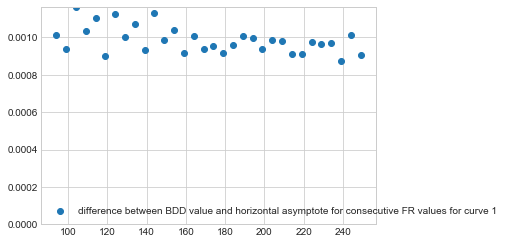

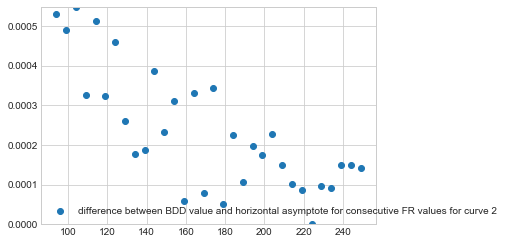

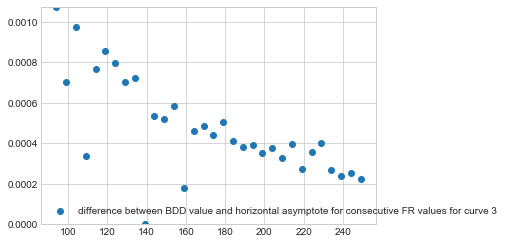

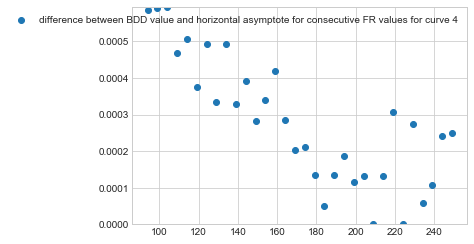

...

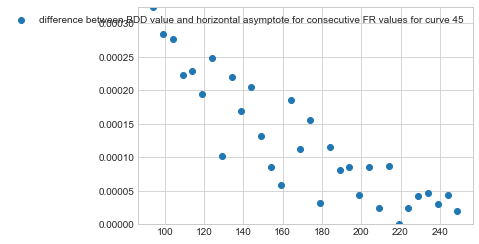

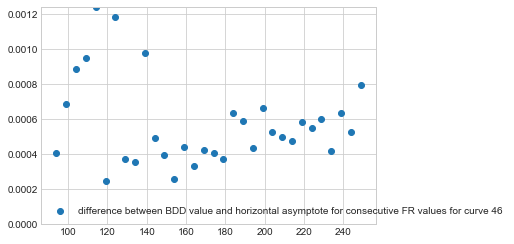

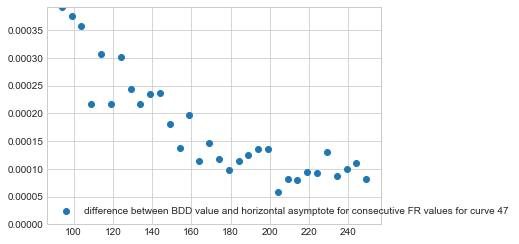

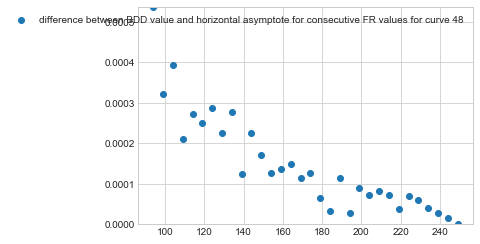

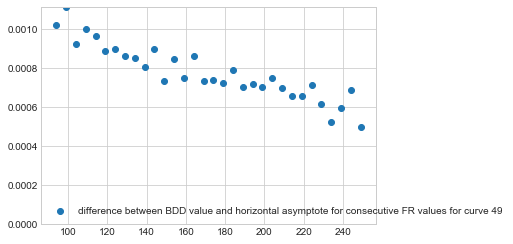

In [167]:
for c in range(50):
    convergence_test_FR(c, 94)

## Plots 

In [136]:
# New plots (without transforming BDD)
#Add the functions to the plots
#Add the horizntal asymptotes to the plots

In [100]:
def ModelPlotFRhigh(curve):
    data_high = FR_test_high[FR_test_high.curve_no == curve]
    data_high = data_high[data_high.FR != 24]
    FR = np.array(data_high['FR']) #x-axis
    BDD = data_high['Value']
    FR_list = FR.tolist()
    BDD_list = BDD.tolist()
    
    plt.scatter(FR, BDD, c = 'g', label = 'FR vs BDD for curve ' + str(curve) + ', for FR > 24')
    plt.ylim(0, max(BDD_list)+0.0005)
    t1 = np.arange(24.0, 254.0, 5.0)
    
    min_BDD = min(BDD_list)
    max_BDD = max(BDD_list)
    
    def bdd_model(fr):
        s = sigmoid((m_values_FRhigh[curve])*fr + c_values_FRhigh[curve])
        return (max_BDD - min_BDD)*s + min_BDD
    
    plt.plot(t1, bdd_model(t1), c = 'r', label = 'model')
    
    plt.show()

    
    

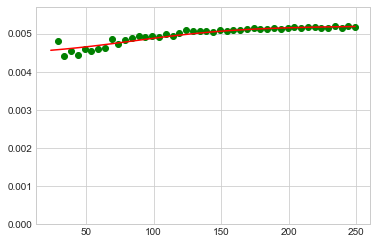

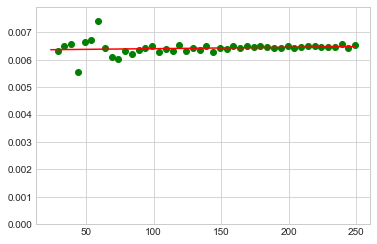

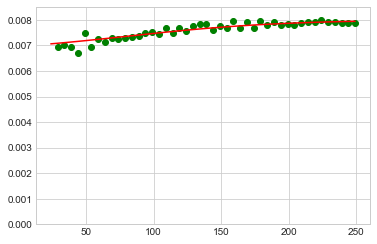

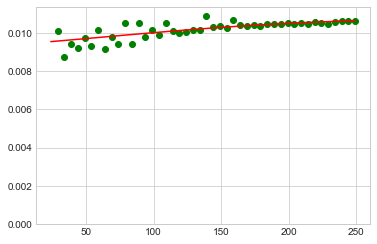

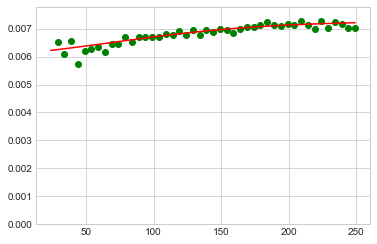

...

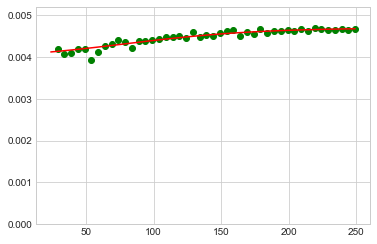

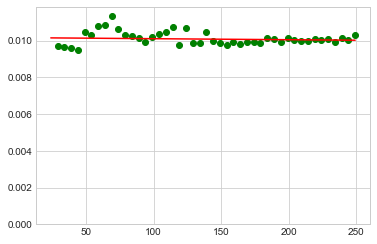

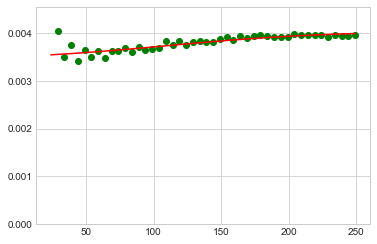

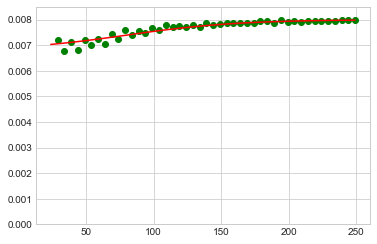

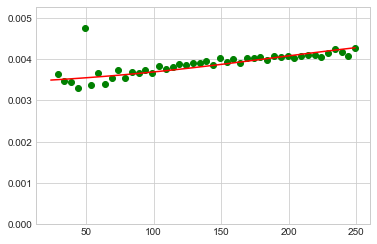

In [101]:
for c in range(50):
    ModelPlotFRhigh(c)

In [158]:
def ModelPlotFRlow(curve):
    data_low = FR_test_low[FR_test_low.curve_no == curve]
    data_low = data_low[data_low.FR != 24]
    FR = np.array(data_low['FR']) #x-axis
    BDD = data_low['Value']
    FR_list = FR.tolist()
    BDD_list = BDD.tolist()
    
    plt.scatter(FR, BDD, c = 'g', label = 'FR vs BDD for curve ' + str(curve))
    plt.ylim(0, max(BDD_list)+0.0005)
    t1 = np.arange(6.0, 24.0, 0.001)
    
    m = m_values_FRlow[curve]
    c = c_values_FRlow[curve]
    minbdd = min_BDD_values_FRlow[curve]
    
    def bdd_model_FRlow(f):
        result = inv_sigmoid_v2((m*((f-53.9)/48))+c) + minbdd
        return result
    
    #result = inv_sigmoid_v2((m*fr)-(24*m)+c) + minbdd
     
    
    
    
    plt.plot(t1, bdd_model_FRlow(t1), c = 'r', label = 'model')
    plt.show()
    

    

0.00011585629389216421
-0.49679479626950424
0.004997605821350957


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in log
  # This is added back by InteractiveShellApp.init_path()


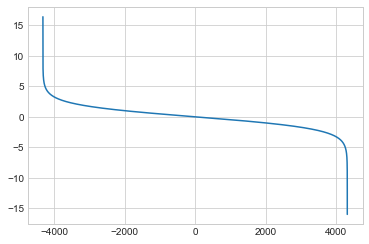

In [152]:
m = m_values_FRlow[0]
print(m)
c = c_values_FRlow[0]
print(c)
minbdd = min_BDD_values_FRlow[0]
print(minbdd)

t1 = np.arange(-10000.0, 10000.0, 0.001)
const = -(24*m)+c
plt.plot(t1, inv_sigmoid_v2((m*t1)+const) + minbdd)
#plt.plot(t1, inv_sigmoid_v2(0.5*t1))
#no asymptotic behaviour

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log
  # This is added back by InteractiveShellApp.init_path()


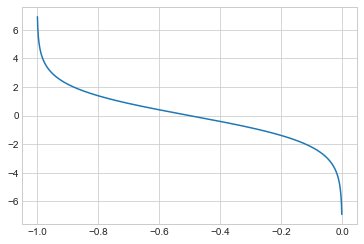

In [153]:
t1 = np.arange(-1.0, 0.0, 0.001)

plt.plot(t1, inv_sigmoid_v2(t1))

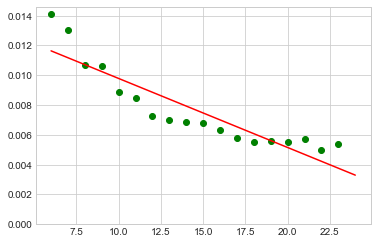

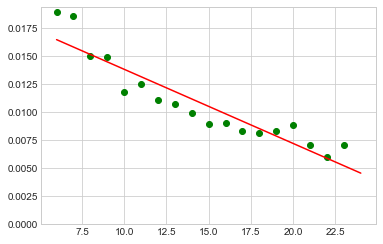

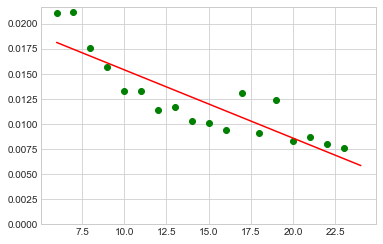

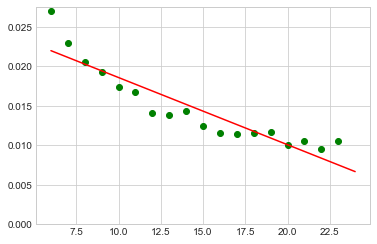

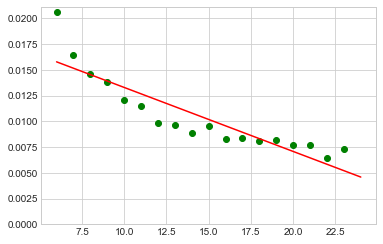

...

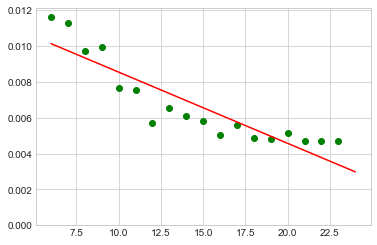

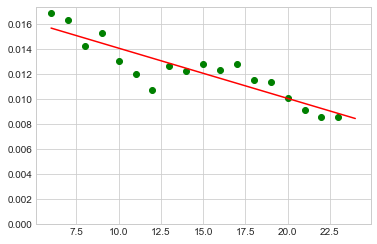

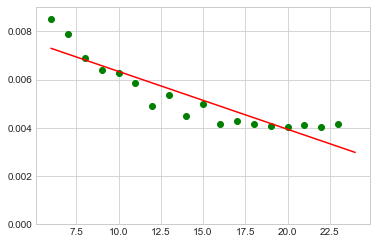

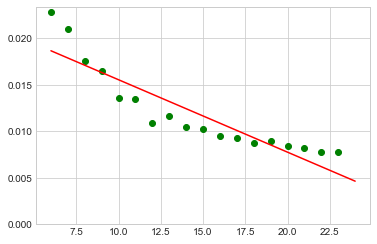

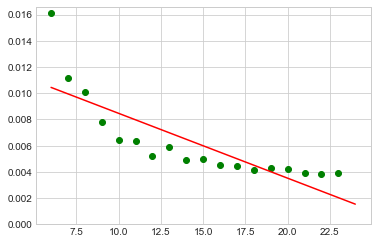

In [159]:
for c in range(50):
    ModelPlotFRlow(c)

In [220]:
#if BDD for FR low was the exact inverse of BDD for FR high
def InvModelPlotFRlow(curve):
    data_low = FR_test_low[FR_test_low.curve_no == curve]
    data_low = data_low[data_low.FR != 24]
    FR = np.array(data_low['FR']) #x-axis
    BDD = data_low['Value']
    FR_list = FR.tolist()
    BDD_list = BDD.tolist()
    
    plt.scatter(FR, BDD, c = 'g', label = 'FR vs BDD for curve ' + str(curve))
    plt.ylim(0, max(BDD_list)+0.0005)
    t1 = np.arange(6.0, 24.0, 0.001)
    
    m = m_values_FRhigh[curve]
    c = c_values_FRhigh[curve]
    minbdd = min_BDD_values_FRhigh[curve]
    range = range_values_FRhigh[curve]
    
    def inv_bdd_model_FRlow(f):
        result = ((-1/m)*np.log((range/(f-minbdd))-1) - (c/m))
        return result
    
    #result = inv_sigmoid_v2((m*fr)-(24*m)+c) + minbdd
     
    
    
    
    plt.plot(t1, inv_bdd_model_FRlow(t1), c = 'r', label = 'inverse model')
    plt.show()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


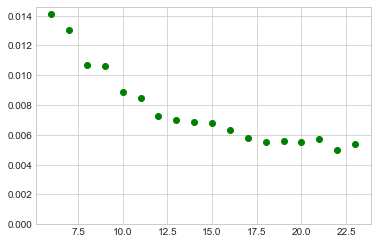

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


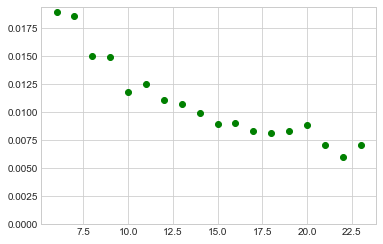

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


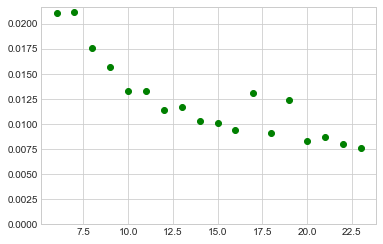

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


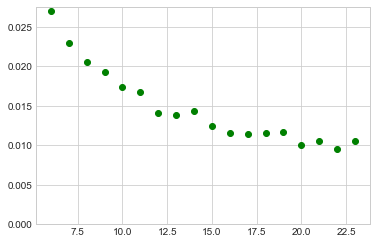

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


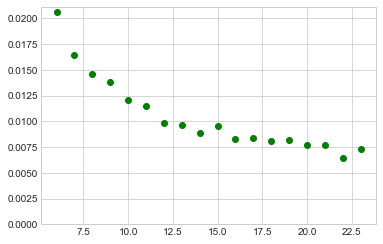

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


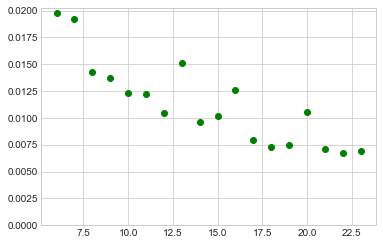

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


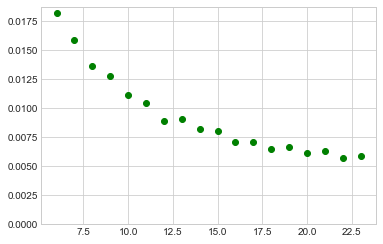

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


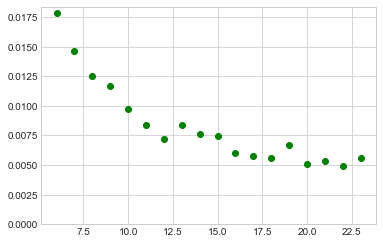

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


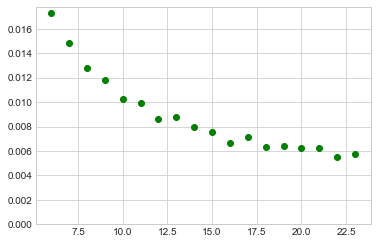

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


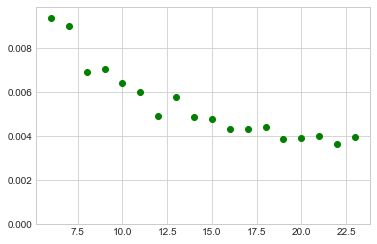

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


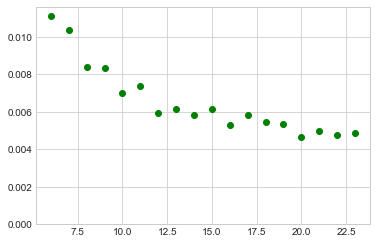

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


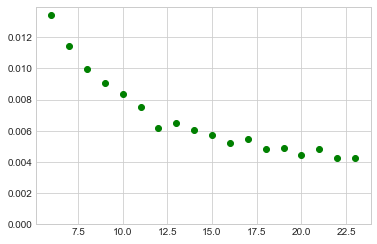

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


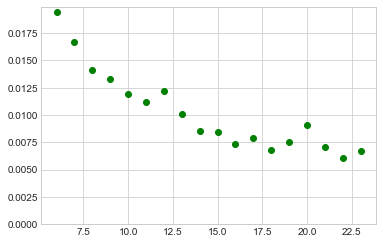

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


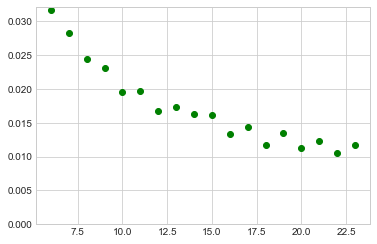

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


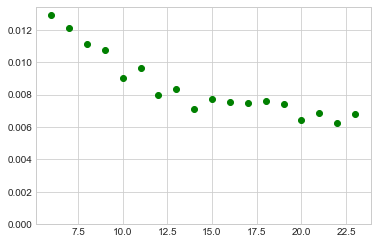

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


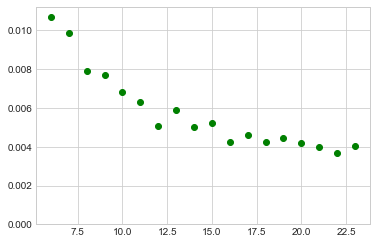

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


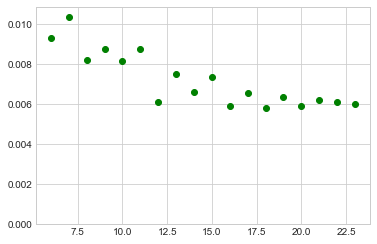

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


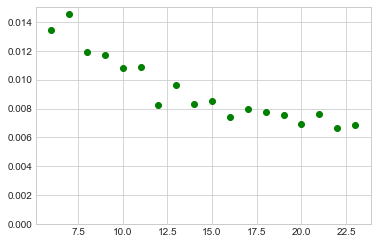

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


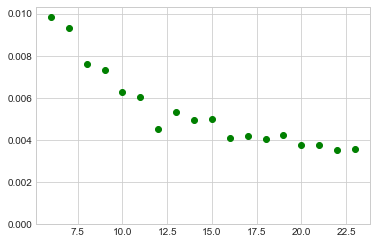

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


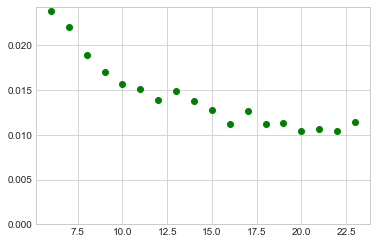

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


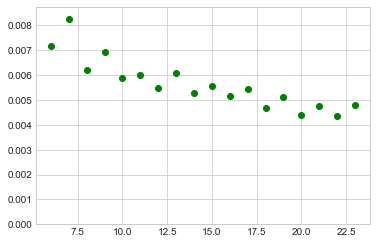

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


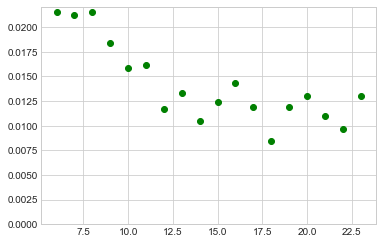

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


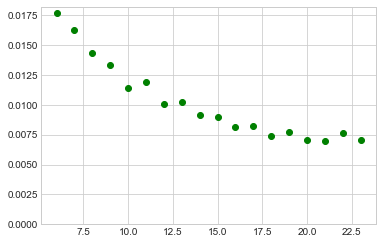

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


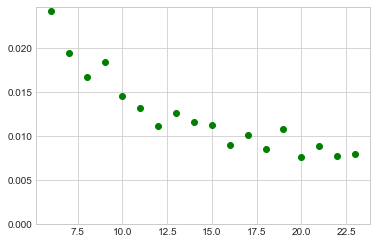

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


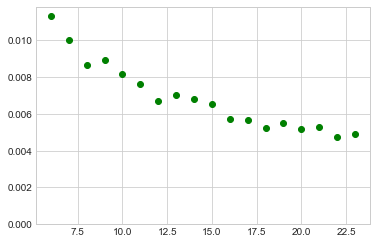

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


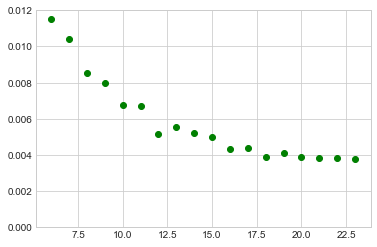

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


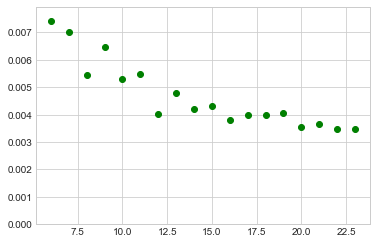

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


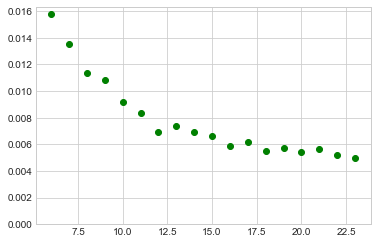

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


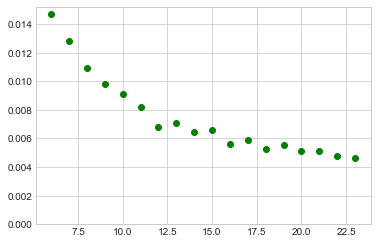

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


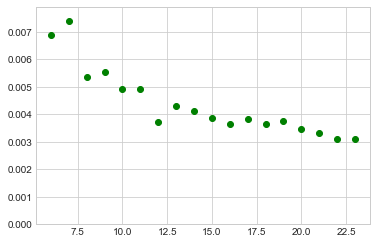

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


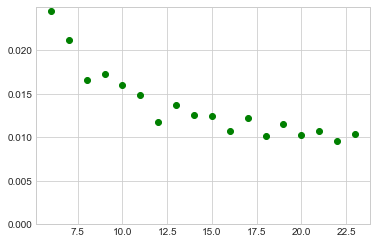

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


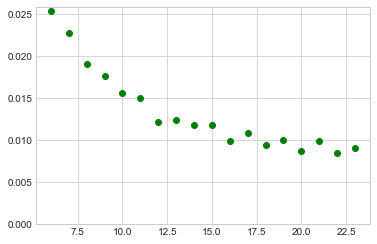

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


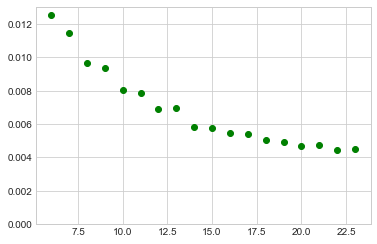

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


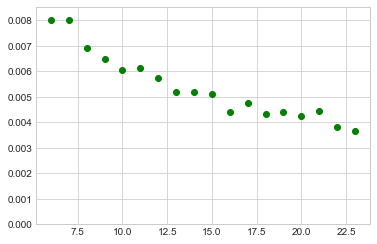

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


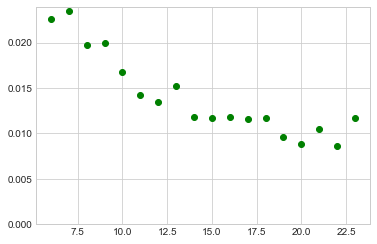

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


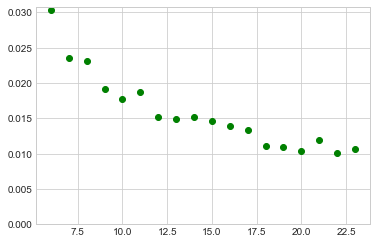

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


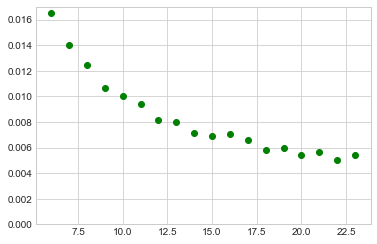

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


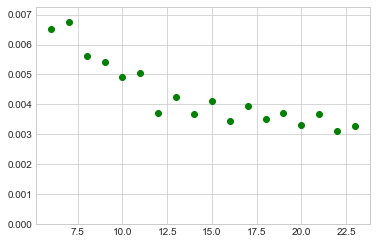

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


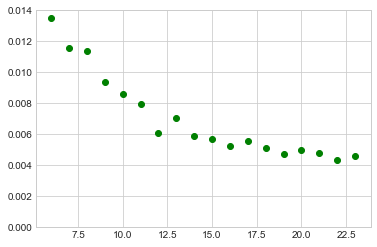

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


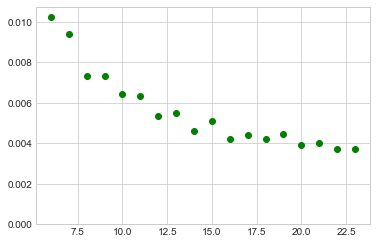

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


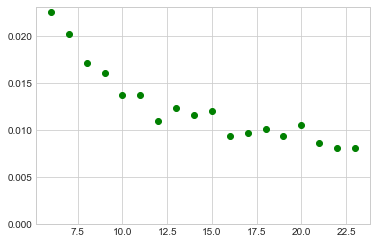

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


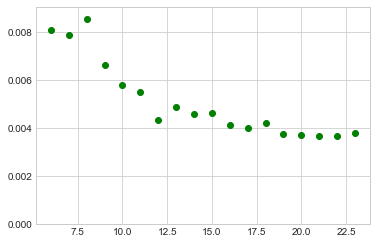

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


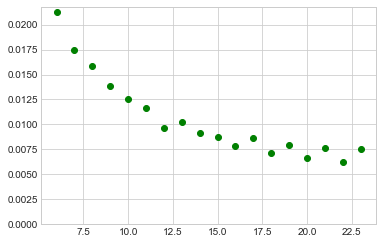

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


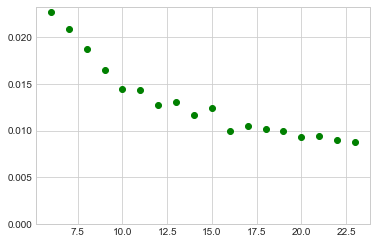

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


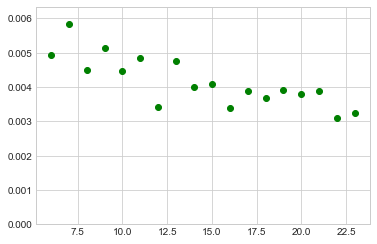

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


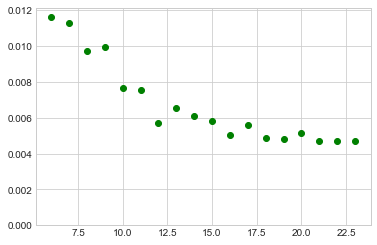

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


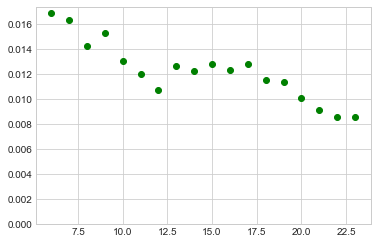

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


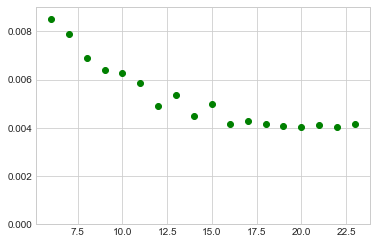

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


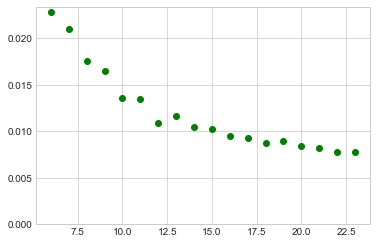

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in double_scalars
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in log
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in double_scalars


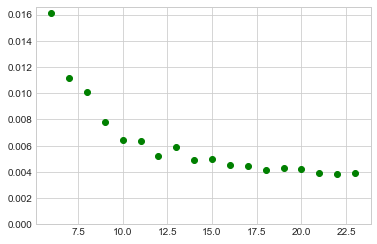

In [221]:
for c in range(50):
    InvModelPlotFRlow(c)

## Regressions for pixel density test

In [370]:
curve_fit = None

In [371]:
#Fit BDD= 1/FR^2 for all density values
#for each curve get the coefficients and compute the horizontal asymptote by computing sigmoid for some very high FR
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import numpy as np

In [388]:
r_values_den = np.zeros(50)
mse_values_den = np.zeros(50)
m_values_den = np.zeros(50)
c_values_den = np.zeros(50)
min_BDD_values_den = np.zeros(50)
h_asymptote_den = np.zeros(50)
# where y = mx + c / we want to store the gradient values to analyse them later

def fitExpRegression(curve):
    data = density_test[density_test.curve_no == curve]
    data = data[data.density != 15]
    density = np.array(data['density']) #x-axis
    BDD = data['Value'] #y-axis

    def f(x):
    # return math.sqrt(x)
       return float(x)

    density = np.array([f(xi) for xi in density])
    BDD = np.array([f(xi) for xi in BDD])
    
    min_BDD = min(BDD)
    min_BDD_values_den[curve] = min_BDD
    
    BDD = BDD - min_BDD + 0.0001


    log_of_BDD = np.log(BDD) #log-y-axis
    
    weights = np.zeros(len(BDD))
    for i in range(len(weights)):
        weights[i] = 5*(i-45)**7
        
    #def fit_func(x, c):
     #   return c * x
    
    #params = curve_fit(fit_func, density, log_of_BDD)
    #c = params[0]

    curve_fit_v = np.polyfit(density, log_of_BDD, 1, w = weights)


#1. Linear transformation curve
    plt.plot(density, curve_fit_v[0]*density + curve_fit_v[1], label = 'predicted values')
    #plt.plot(density, c*density, label = 'predicted values')
    plt.plot(density, log_of_BDD, "o", label = 'actual values')
    plt.title("density vs log(BDD) for curve no." + str(curve))
    plt.xlabel('density')
    plt.ylabel('log(BDD)')
    plt.legend()
    plt.show()

#equation fo the line: log(BDD) = curve_fit[0] * FR + curve_fit[1]

    #log_of_BDD_pred = curve_fit[0] * density + curve_fit[1]
    log_of_BDD_pred = c * density
    print('Equation of the line of best fit for curve no. '+str(curve)+': '+'log_of_BDD_pred = '+str(curve_fit_v[0])+ '*density '+'+ '+str(curve_fit_v[1]))

#correlation coef (Pearson's r):
    r_matrix = np.corrcoef(density, log_of_BDD)
    r = r_matrix[0, 1]
    print('The correlation coeffcient for FR and log(BDD) is equal to r =' + str(r))
    r_values_den[curve] = r

#mean-squared-error
    mse = mean_squared_error(log_of_BDD, log_of_BDD_pred) 
    print('The Mean-Squared Error is equal to ' + str(mse))
    mse_values_den[curve]=mse
    
#store line data
    m_values_den[curve]=curve_fit_v[0]
    c_values_den[curve]=curve_fit_v[1]
    #m_values_den[curve]=c
    
    def bdd_model_den(d):
        m = m_values_den[curve]
        c = c_values_den[curve]
        minbdd = min_BDD_values_den[curve]
        return (np.exp((m*d)+c) + minbdd)
    
    h_asymptote_den[curve] = bdd_model_den(10000)
    
    #or linear equation without constant: so that the asymptote is x = 0

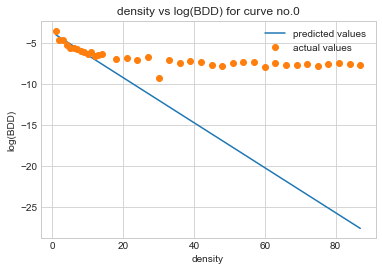

Equation of the line of best fit for curve no. 0: log_of_BDD_pred = -0.274260645721758*density + -3.731536604344366
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7399556748302412
The Mean-Squared Error is equal to 47.39865721897408


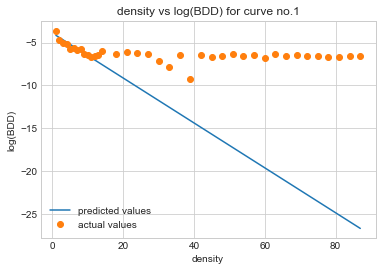

Equation of the line of best fit for curve no. 1: log_of_BDD_pred = -0.26224060988213826*density + -3.895668957405999
The correlation coeffcient for FR and log(BDD) is equal to r =-0.4525588332175847
The Mean-Squared Error is equal to 2556.0789179764565


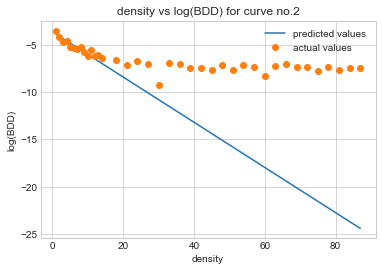

Equation of the line of best fit for curve no. 2: log_of_BDD_pred = -0.23938813462122022*density + -3.5954496163406757
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7468128969844092
The Mean-Squared Error is equal to 9249.868911125226


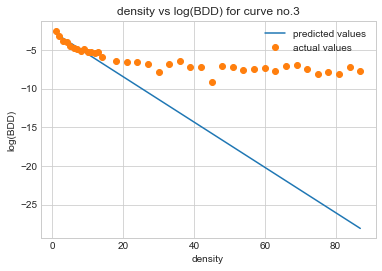

Equation of the line of best fit for curve no. 3: log_of_BDD_pred = -0.29253944029228945*density + -2.6261124086815446
The correlation coeffcient for FR and log(BDD) is equal to r =-0.8180447040049549
The Mean-Squared Error is equal to 19969.28927652445


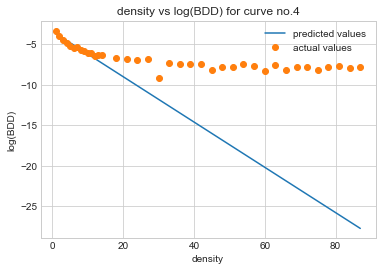

Equation of the line of best fit for curve no. 4: log_of_BDD_pred = -0.2795500963463151*density + -3.4148167349742713
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7939209375933622
The Mean-Squared Error is equal to 34872.112053304074


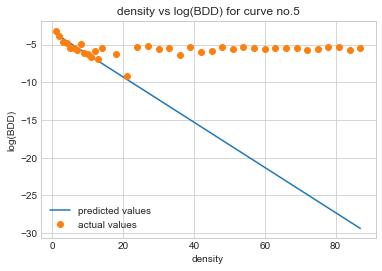

Equation of the line of best fit for curve no. 5: log_of_BDD_pred = -0.29959109286049507*density + -3.3076748268395324
The correlation coeffcient for FR and log(BDD) is equal to r =-0.03319401644742021
The Mean-Squared Error is equal to 53050.11080304912


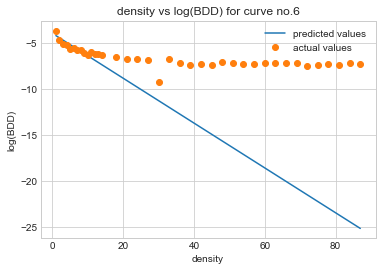

Equation of the line of best fit for curve no. 6: log_of_BDD_pred = -0.24302277695283328*density + -3.977922386488316
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7116693873381298
The Mean-Squared Error is equal to 76571.18641989274


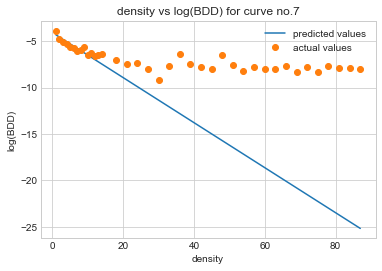

Equation of the line of best fit for curve no. 7: log_of_BDD_pred = -0.24244615004152406*density + -4.073753705744324
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7593518198064662
The Mean-Squared Error is equal to 103862.39597173892


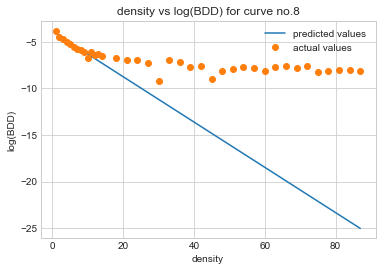

Equation of the line of best fit for curve no. 8: log_of_BDD_pred = -0.24282782140580414*density + -3.8939403006216238
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7953304386294126
The Mean-Squared Error is equal to 135047.01626684892


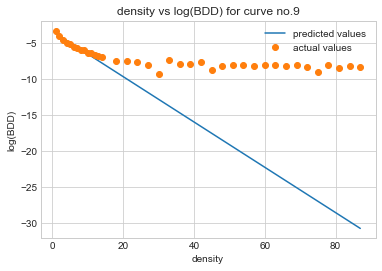

Equation of the line of best fit for curve no. 9: log_of_BDD_pred = -0.3149360919402481*density + -3.308494092964107
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7825685414833525
The Mean-Squared Error is equal to 170438.63884719065


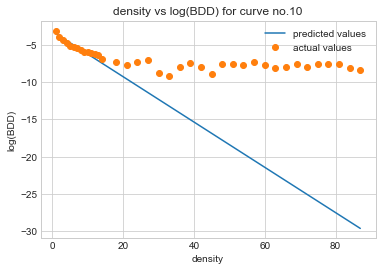

Equation of the line of best fit for curve no. 10: log_of_BDD_pred = -0.3031932408140911*density + -3.2274502213097778
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7239728753077136
The Mean-Squared Error is equal to 209586.4521109351


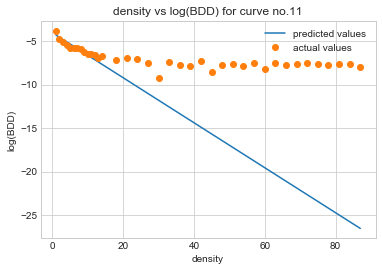

Equation of the line of best fit for curve no. 11: log_of_BDD_pred = -0.2585605151453367*density + -4.044632889599749
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7176316585412039
The Mean-Squared Error is equal to 252890.57927205996


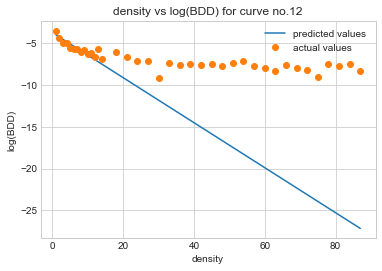

Equation of the line of best fit for curve no. 12: log_of_BDD_pred = -0.2683921210370815*density + -3.787387421123101
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7942875847959717
The Mean-Squared Error is equal to 300414.06205975835


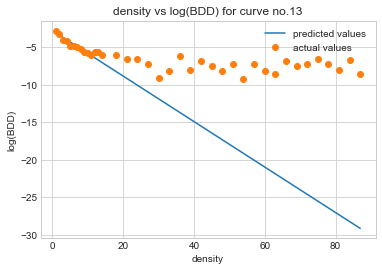

Equation of the line of best fit for curve no. 13: log_of_BDD_pred = -0.30332149780204093*density + -2.780413401251293
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7254667500110324
The Mean-Squared Error is equal to 351672.2527590424


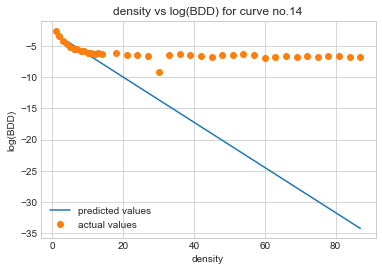

Equation of the line of best fit for curve no. 14: log_of_BDD_pred = -0.3613724173747239*density + -2.7766440918969915
The correlation coeffcient for FR and log(BDD) is equal to r =-0.5656375098639889
The Mean-Squared Error is equal to 406520.7327628264


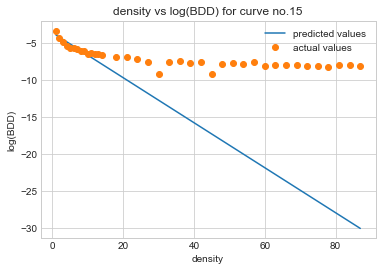

Equation of the line of best fit for curve no. 15: log_of_BDD_pred = -0.30305043573168733*density + -3.6478315668902606
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7801902838283857
The Mean-Squared Error is equal to 467469.2645143759


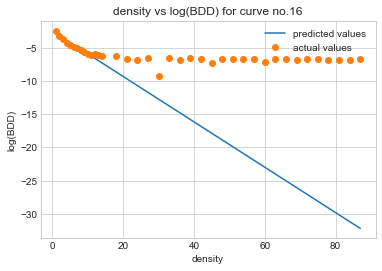

Equation of the line of best fit for curve no. 16: log_of_BDD_pred = -0.34120067445169766*density + -2.503853004354247
The correlation coeffcient for FR and log(BDD) is equal to r =-0.6157189212285458
The Mean-Squared Error is equal to 529964.7177652137


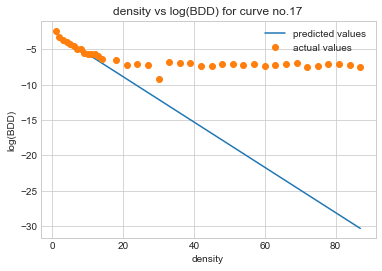

Equation of the line of best fit for curve no. 17: log_of_BDD_pred = -0.32021210394796107*density + -2.4684146813379595
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7085051963998693
The Mean-Squared Error is equal to 598213.3043689518


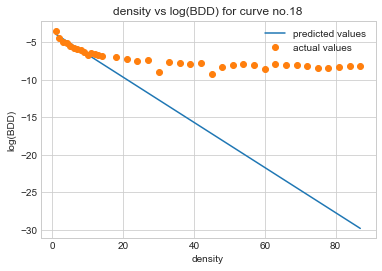

Equation of the line of best fit for curve no. 18: log_of_BDD_pred = -0.30122084043352043*density + -3.60835699239381
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7923392239823597
The Mean-Squared Error is equal to 671262.9400872987


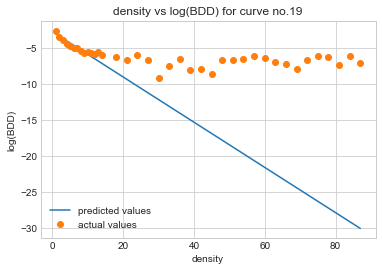

Equation of the line of best fit for curve no. 19: log_of_BDD_pred = -0.31408434509734123*density + -2.7638155771169197
The correlation coeffcient for FR and log(BDD) is equal to r =-0.5839633176906702
The Mean-Squared Error is equal to 745755.0827985742


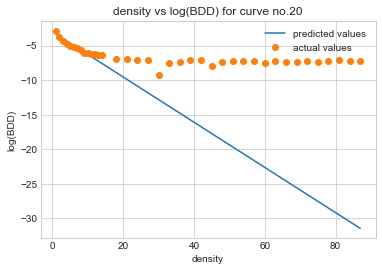

Equation of the line of best fit for curve no. 20: log_of_BDD_pred = -0.3274696941644284*density + -2.997043549734251
The correlation coeffcient for FR and log(BDD) is equal to r =-0.6625355784706161
The Mean-Squared Error is equal to 826338.3720174952


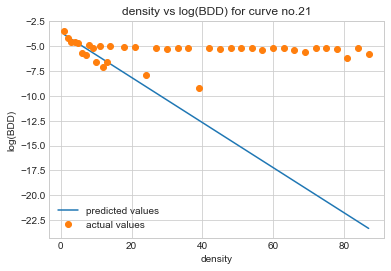

Equation of the line of best fit for curve no. 21: log_of_BDD_pred = -0.2268524646090559*density + -3.6005756871611974
The correlation coeffcient for FR and log(BDD) is equal to r =-0.10057651872595222
The Mean-Squared Error is equal to 907931.7222150684


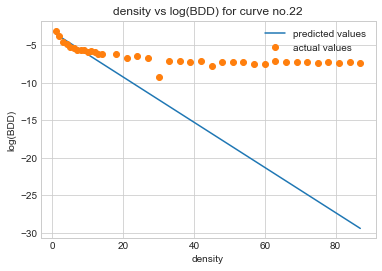

Equation of the line of best fit for curve no. 22: log_of_BDD_pred = -0.3012979522561033*density + -3.219295537607566
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7312278700434255
The Mean-Squared Error is equal to 998665.2259861609


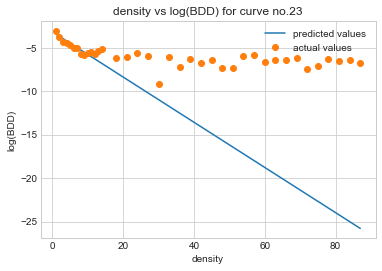

Equation of the line of best fit for curve no. 23: log_of_BDD_pred = -0.25999762715417846*density + -3.175713991799525
The correlation coeffcient for FR and log(BDD) is equal to r =-0.6280296855544789
The Mean-Squared Error is equal to 1089896.9040983913


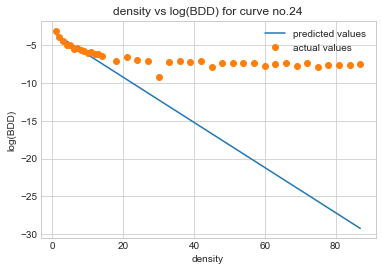

Equation of the line of best fit for curve no. 24: log_of_BDD_pred = -0.29947585508211017*density + -3.219491216677073
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7508905972645055
The Mean-Squared Error is equal to 1187657.8145541719


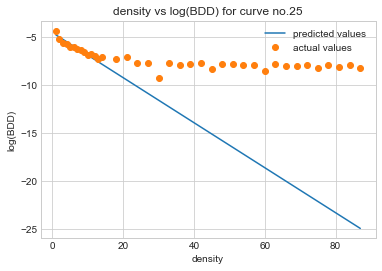

Equation of the line of best fit for curve no. 25: log_of_BDD_pred = -0.23452695197137885*density + -4.497753998342846
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7572687606614315
The Mean-Squared Error is equal to 1289061.580338839


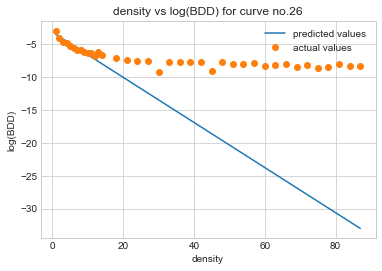

Equation of the line of best fit for curve no. 26: log_of_BDD_pred = -0.3431358947524848*density + -3.1746569970281153
The correlation coeffcient for FR and log(BDD) is equal to r =-0.795274212498368
The Mean-Squared Error is equal to 1393945.9723248545


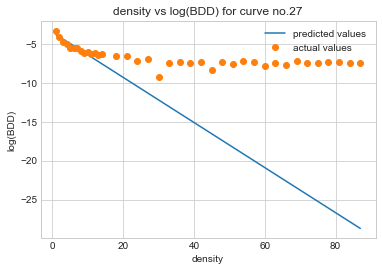

Equation of the line of best fit for curve no. 27: log_of_BDD_pred = -0.28933090406099876*density + -3.5303013197929833
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7124010927681617
The Mean-Squared Error is equal to 1501391.5119147107


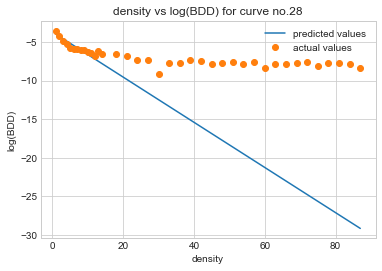

Equation of the line of best fit for curve no. 28: log_of_BDD_pred = -0.2929196029654402*density + -3.6961538888345236
The correlation coeffcient for FR and log(BDD) is equal to r =-0.775036152473573
The Mean-Squared Error is equal to 1614727.2543748026


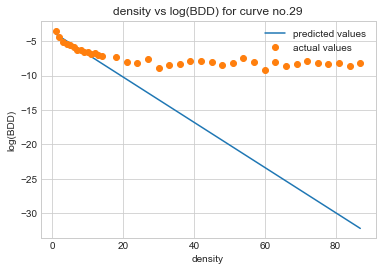

Equation of the line of best fit for curve no. 29: log_of_BDD_pred = -0.3281826392917478*density + -3.6567723472043014
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7439693103160459
The Mean-Squared Error is equal to 1732424.6459861689


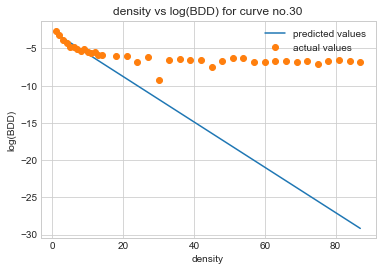

Equation of the line of best fit for curve no. 30: log_of_BDD_pred = -0.30462933466798*density + -2.6775530775340584
The correlation coeffcient for FR and log(BDD) is equal to r =-0.669979906851715
The Mean-Squared Error is equal to 1850207.5715117035


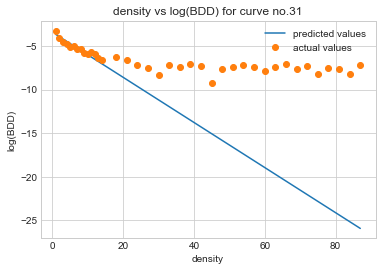

Equation of the line of best fit for curve no. 31: log_of_BDD_pred = -0.25827356696328707*density + -3.4395455294353092
The correlation coeffcient for FR and log(BDD) is equal to r =-0.766269157711342
The Mean-Squared Error is equal to 1976922.1540333072


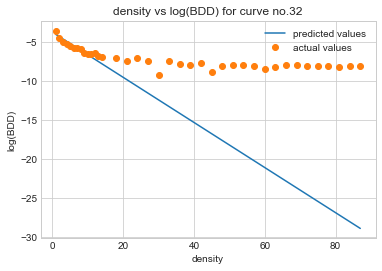

Equation of the line of best fit for curve no. 32: log_of_BDD_pred = -0.28888398844712176*density + -3.719024239208675
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7758328912104369
The Mean-Squared Error is equal to 2106970.2546992823


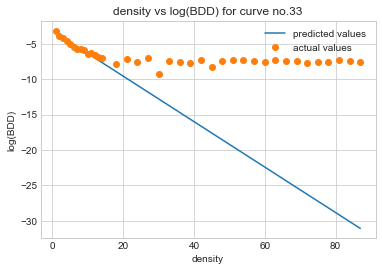

Equation of the line of best fit for curve no. 33: log_of_BDD_pred = -0.32114716394255066*density + -3.1503450146027907
The correlation coeffcient for FR and log(BDD) is equal to r =-0.651146023715477
The Mean-Squared Error is equal to 2239066.792562593


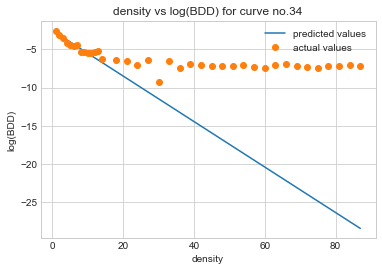

Equation of the line of best fit for curve no. 34: log_of_BDD_pred = -0.2977363754026482*density + -2.5352640245559788
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7375990460482572
The Mean-Squared Error is equal to 2375272.805384172


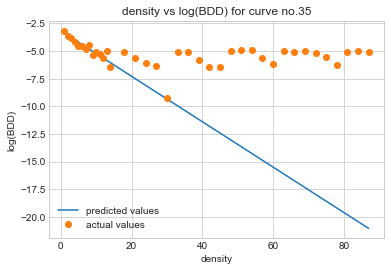

Equation of the line of best fit for curve no. 35: log_of_BDD_pred = -0.20545090529788704*density + -3.1714335011161667
The correlation coeffcient for FR and log(BDD) is equal to r =-0.2487050133202865
The Mean-Squared Error is equal to 2512630.8163614315


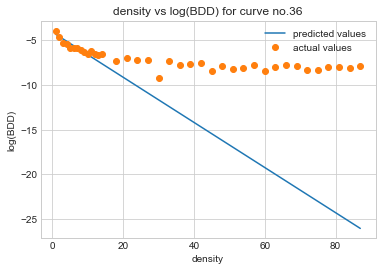

Equation of the line of best fit for curve no. 36: log_of_BDD_pred = -0.25167618832808136*density + -4.119229275147623
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7962046399665744
The Mean-Squared Error is equal to 2664033.146056313


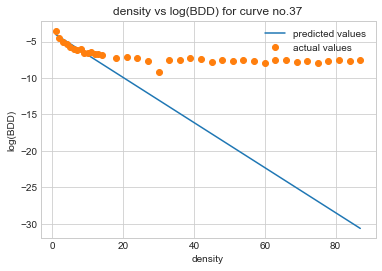

Equation of the line of best fit for curve no. 37: log_of_BDD_pred = -0.3088364378694454*density + -3.7502177891524346
The correlation coeffcient for FR and log(BDD) is equal to r =-0.6979736521885398
The Mean-Squared Error is equal to 2812717.5108725224


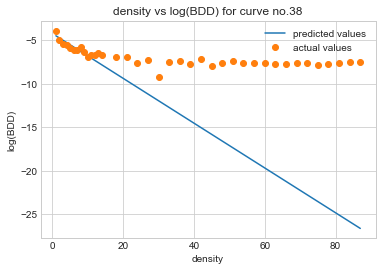

Equation of the line of best fit for curve no. 38: log_of_BDD_pred = -0.25778845697317776*density + -4.203135314888361
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7048809798758146
The Mean-Squared Error is equal to 2966106.3965779077


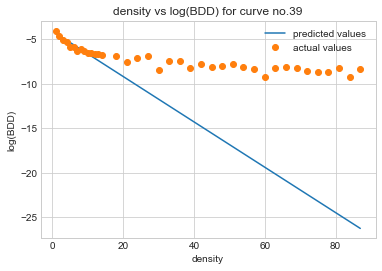

Equation of the line of best fit for curve no. 39: log_of_BDD_pred = -0.2547467238308571*density + -4.0690526353555025
The correlation coeffcient for FR and log(BDD) is equal to r =-0.8748272395102821
The Mean-Squared Error is equal to 3125346.435448584


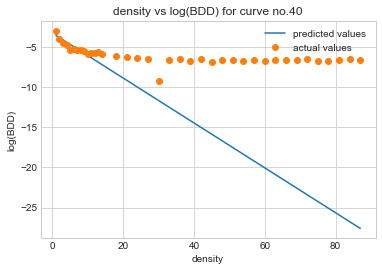

Equation of the line of best fit for curve no. 40: log_of_BDD_pred = -0.27960053400352036*density + -3.278678709653245
The correlation coeffcient for FR and log(BDD) is equal to r =-0.6230192259573089
The Mean-Squared Error is equal to 3282774.948504171


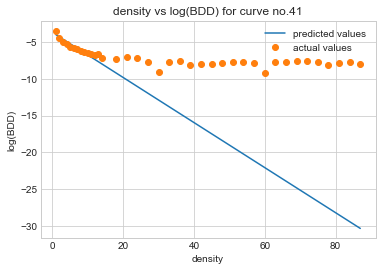

Equation of the line of best fit for curve no. 41: log_of_BDD_pred = -0.3065802024445013*density + -3.6865032482216717
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7176088036554166
The Mean-Squared Error is equal to 3451905.2143674456


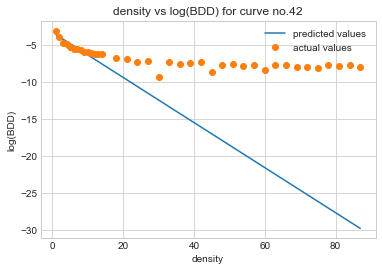

Equation of the line of best fit for curve no. 42: log_of_BDD_pred = -0.30514543619126394*density + -3.2298632483259735
The correlation coeffcient for FR and log(BDD) is equal to r =-0.784337716764311
The Mean-Squared Error is equal to 3621330.074120919


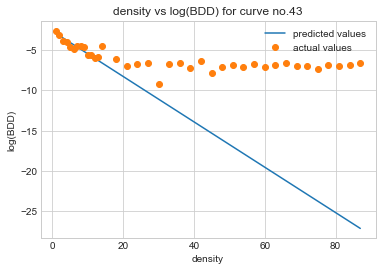

Equation of the line of best fit for curve no. 43: log_of_BDD_pred = -0.2810665863202269*density + -2.6604389632039878
The correlation coeffcient for FR and log(BDD) is equal to r =-0.6920999539750984
The Mean-Squared Error is equal to 3792840.3278354187


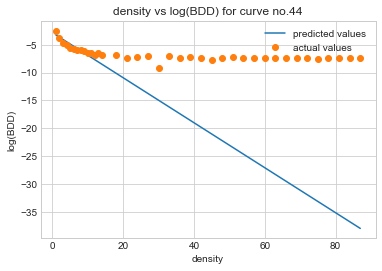

Equation of the line of best fit for curve no. 44: log_of_BDD_pred = -0.4033071175412997*density + -2.862242424339394
The correlation coeffcient for FR and log(BDD) is equal to r =-0.6340875283583219
The Mean-Squared Error is equal to 3972426.355873573


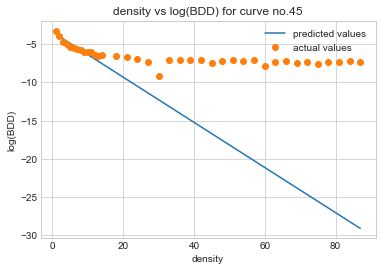

Equation of the line of best fit for curve no. 45: log_of_BDD_pred = -0.2960147636757947*density + -3.3785321674897038
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7037525257151179
The Mean-Squared Error is equal to 4154025.045047939


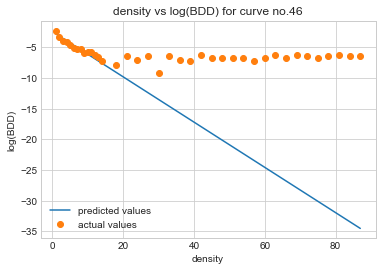

Equation of the line of best fit for curve no. 46: log_of_BDD_pred = -0.3691784871094998*density + -2.4083861463406198
The correlation coeffcient for FR and log(BDD) is equal to r =-0.45773742040633536
The Mean-Squared Error is equal to 4338158.205381985


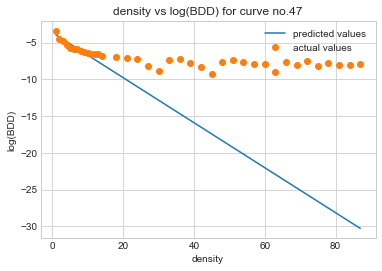

Equation of the line of best fit for curve no. 47: log_of_BDD_pred = -0.3061679197666922*density + -3.6541040201635058
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7399461779397523
The Mean-Squared Error is equal to 4532422.075530795


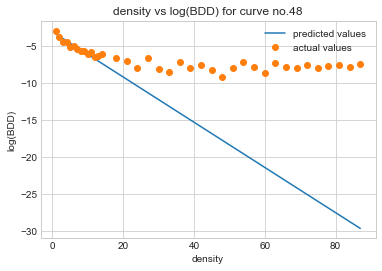

Equation of the line of best fit for curve no. 48: log_of_BDD_pred = -0.30514089623719437*density + -3.0915186612042214
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7447222199002307
The Mean-Squared Error is equal to 4726250.802248073


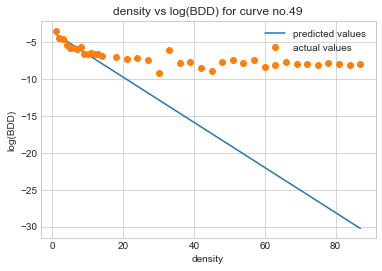

Equation of the line of best fit for curve no. 49: log_of_BDD_pred = -0.3063246096635927*density + -3.6042120342667707
The correlation coeffcient for FR and log(BDD) is equal to r =-0.7356734798220617
The Mean-Squared Error is equal to 4925043.596705464
[-0.73995567 -0.45255883 -0.7468129  -0.8180447  -0.79392094 -0.03319402
 -0.71166939 -0.75935182 -0.79533044 -0.78256854 -0.72397288 -0.71763166
 -0.79428758 -0.72546675 -0.56563751 -0.78019028 -0.61571892 -0.7085052
 -0.79233922 -0.58396332 -0.66253558 -0.10057652 -0.73122787 -0.62802969
 -0.7508906  -0.75726876 -0.79527421 -0.71240109 -0.77503615 -0.74396931
 -0.66997991 -0.76626916 -0.77583289 -0.65114602 -0.73759905 -0.24870501
 -0.79620464 -0.69797365 -0.70488098 -0.87482724 -0.62301923 -0.7176088
 -0.78433772 -0.69209995 -0.63408753 -0.70375253 -0.45773742 -0.73994618
 -0.74472222 -0.73567348]
[4.73986572e+01 2.55607892e+03 9.24986891e+03 1.99692893e+04
 3.48721121e+04 5.30501108e+04 7.65711864e+04 1.03862396e+05
 1.35047016e+05 

In [389]:
for c in range(50):
    fitExpRegression(c)
print(r_values_den)
print(mse_values_den)
print(m_values_den)
print(c_values_den)
print(h_asymptote_den)
print(min_BDD_values_den)

## Convergence test for density tests

In [186]:
#def convergence_test by checking if the distance (abs value) between BDD and horizontal asymptote is decreasing

In [195]:
def convergence_test_den(curve, epsilon):

    data = density_test[density_test.curve_no == curve]
    data = data[data.density != 15]
    density = np.array(data['density']) #x-axis
    BDD = data['Value']
    density_list = density.tolist()
    BDD_list = BDD.tolist()
    E_idx = density_list.index(epsilon)
    maxi = len(density_list)
    l = density_list

    asymptote = h_asymptote_den[curve]   

    
    def BDD_d(i):
        if i > 0 and i < len(BDD_list):
            d = np.abs(BDD_list[i]- asymptote)
            return (d)
    
    BDD_diff = []
    for idx in range(E_idx, maxi, 1):
        BDD_diff.append(BDD_d(idx))
        
        
    x_axis = l[E_idx:]
    #list(range(epsilon, FR_list[-1], 4))
    plt.scatter(x_axis, BDD_diff, label = 'difference between BDD value and horizontal asymptote for consecutive density values for curve '+ str(curve))
    plt.legend()
    plt.ylim(0, max(BDD_diff)+0.00001)
    

    plt.show()
        

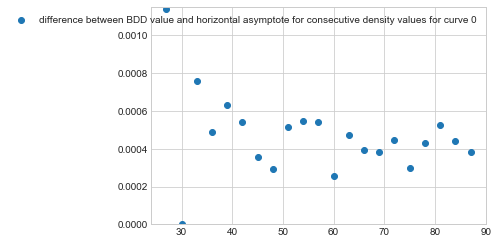

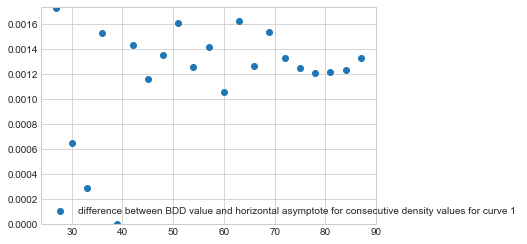

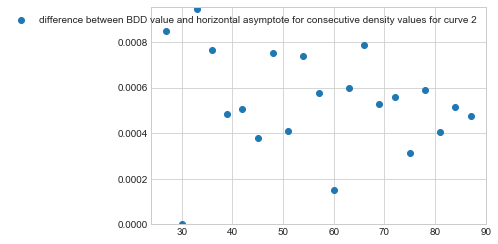

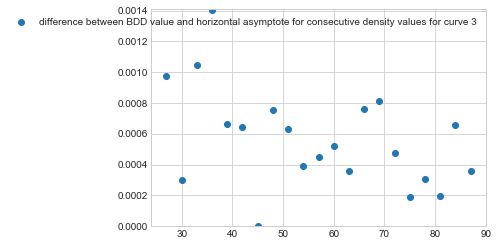

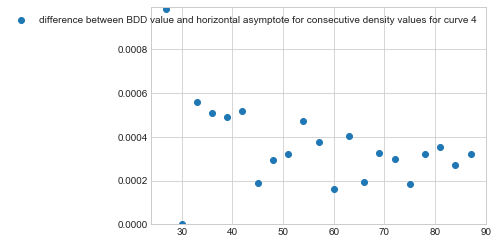

...

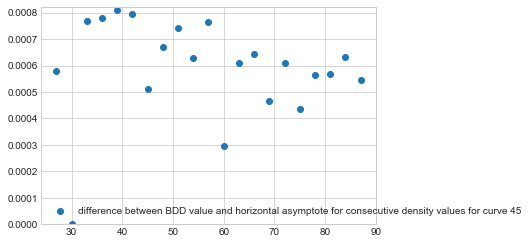

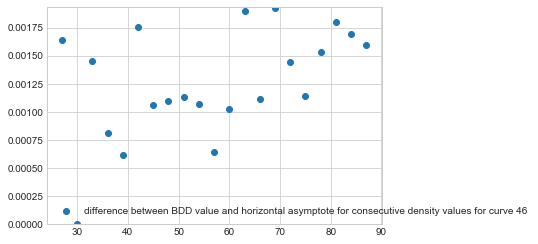

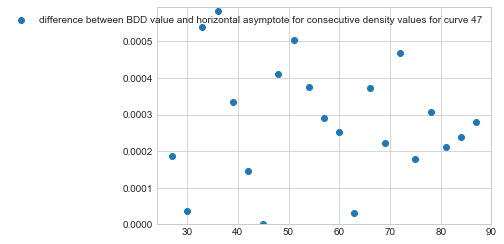

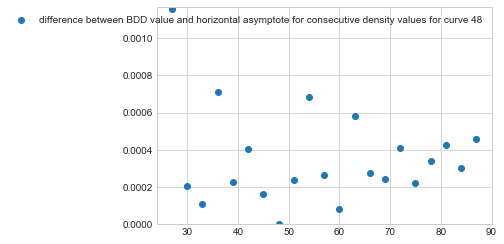

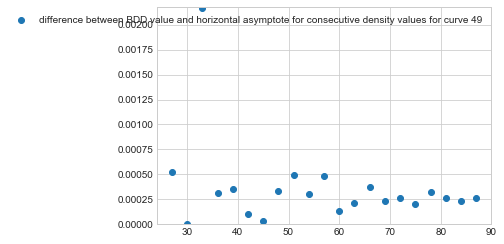

In [196]:
for c in range(50):
    convergence_test_den(c, 27)

## Plots

In [ ]:
# New plots (without transforming BDD)
#Add the functions to the plots
#Add the horizntal asymptotes to the plots

In [390]:
def ModelPlotDEN(curve):
    data = density_test[density_test.curve_no == curve]
    data = data[data.density != 15]
    density = np.array(data['density']) #x-axis
    BDD = data['Value']
    density_list = density.tolist()
    BDD_list = BDD.tolist()
    
    plt.scatter(density, BDD, c = 'g', label = 'density vs BDD for curve ' + str(curve))
    plt.ylim(0, max(BDD_list)+0.0005)
    t1 = np.arange(0.0, 90.0, 0.0001)
    
    def bdd_model_den(d):
        m = m_values_den[curve]
        c = c_values_den[curve]

        minbdd = min_BDD_values_den[curve]
        return (np.exp((m*d)+c) + minbdd)
    
    plt.plot(t1, bdd_model_den(t1), c = 'r', label = 'model')
    
    plt.show()



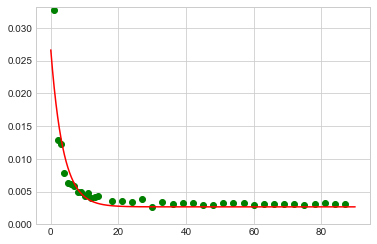

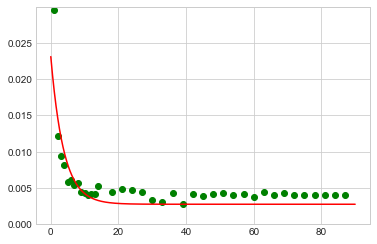

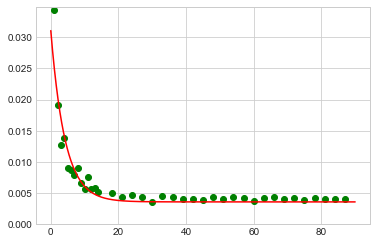

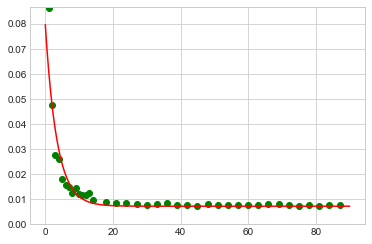

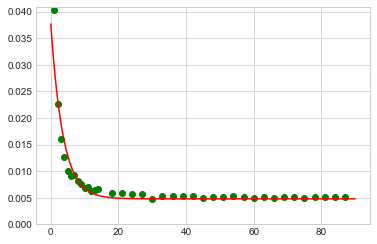

...

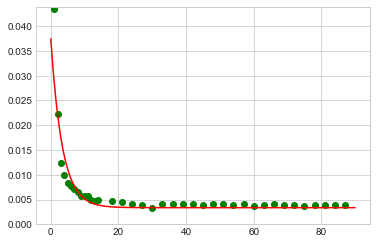

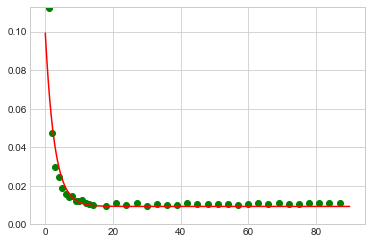

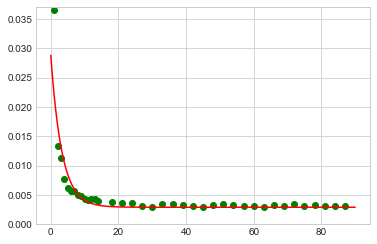

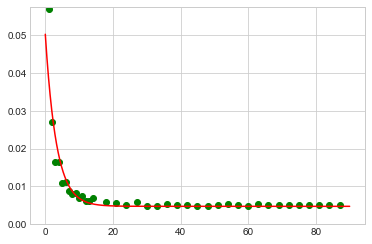

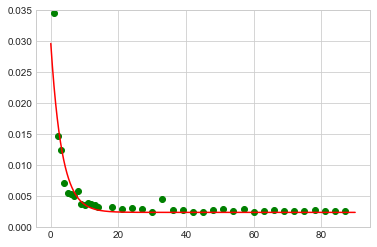

In [391]:
for c in range(50):
    ModelPlotDEN(c)